<a href="https://colab.research.google.com/github/JhonataMiranda/GNN-Test-CodeDepot/blob/main/Segmentacao_boi_dorsal_2023_IoU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Montando drive para armazenar o dataset



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Instalando e Importando bibliotecas a serem utilizadas no modelo:

In [ ]:
import os
!pip install -U -q segmentation-models
!pip install -q tensorflow==2.2.1
!pip install -q keras==2.5
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

ERROR: Could not find a version that satisfies the requirement tensorflow==2.2.1 (from versions: 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.11.1, 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0, 2.14.1, 2.15.0rc0, 2.15.0rc1, 2.15.0, 2.15.0.post1, 2.15.1, 2.16.0rc0, 2.16.1, 2.17.0rc0)
ERROR: No matching distribution found for tensorflow==2.2.1
ERROR: Could not find a version that satisfies the requirement keras==2.5 (from versions: 0.2.0, 0.3.0, 0.3.1, 0.3.2, 0.3.3, 1.0.0, 1.0.1, 1.0.2, 1.0.3, 1.0.4, 1.0.5, 1.0.6, 1.0.7, 1.0.8, 1.1.0, 1.1.1, 1.1.2, 1.2.0, 1.2.1, 1.2.2, 2.0.0, 2.0.1, 2.0.2, 2.0.3, 2.0.4, 2.0.5, 2.0.6, 2.0.7, 2.0.8, 2.0.9, 2.1.0, 2.1.1, 2.1.2, 2.1.3, 2.1.4, 2.1.5, 2.1.6, 2.2.0, 2.2.1, 2.2.2, 2.2.3, 2.2.4, 2.2.5, 2.3.0, 2.3.1, 2.4.0, 2.

In [ ]:
import tensorflow as tf
import cv2
import time
import numpy as np
from skimage.io import imread, imshow, imsave
from skimage import img_as_ubyte
import random
import matplotlib.pyplot as plt
from tqdm import tqdm
from albumentations import HorizontalFlip, CoarseDropout, RandomBrightness, RandomBrightnessContrast

Definindo tamanho da imagem a ser utilizado:



In [ ]:
# DEF IMG SHAPE
IMG_WIDTH = 256
IMG_HEIGTH = 256
IMG_CHANNELS = 3

Definindo funções de redimensionamento de imagem:


In [ ]:
# DEF RESIZING-IMAGE FUNCTIONS

def completar_imagem(imagem):
    # Verificar o tamanho da imagem
    altura, largura, _ = imagem.shape

    # Criar uma nova imagem preta com tamanho 512x512
    nova_imagem = np.zeros((2048, 2048, 3), dtype=np.uint8)

    # Calcular as coordenadas para colar a imagem original no centro da nova imagem
    start_x = (2048 - largura) // 2
    start_y = (2048 - altura) // 2
    end_x = start_x + largura
    end_y = start_y + altura

    # Colar a imagem original no centro da nova imagem
    nova_imagem[start_y:end_y, start_x:end_x] = imagem

    return nova_imagem

def completar_mascara(imagem):
    # Verificar o tamanho da imagem
    altura, largura = imagem.shape

    # Criar uma nova imagem preta com tamanho 512x512
    nova_imagem = np.zeros((2048, 2048), dtype=np.uint8)

    # Calcular as coordenadas para colar a imagem original no centro da nova imagem
    start_x = (2048 - largura) // 2
    start_y = (2048 - altura) // 2
    end_x = start_x + largura
    end_y = start_y + altura

    # Colar a imagem original no centro da nova imagem
    nova_imagem[start_y:end_y, start_x:end_x] = imagem
    return nova_imagem

def cut(image):
    c = image[664:1384,384:1664]  # (720, 1024, 3) usar 640x1152
    return c


def rescale_cut(image,flag = 0):
    x = image
    h = 256
    w = 256
    x = cv2.resize(x, (w, h))

    if flag == 1 :
      # Aplicando thresholding adaptativo
      thresh = cv2.adaptiveThreshold(x, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

      # Encontrando contornos na imagem
      contornos, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

      # Criando uma máscara vazia
      mascara = np.zeros_like(x)

      # Desenhando os contornos na máscara
      cv2.drawContours(mascara, contornos, -1, (255), thickness=cv2.FILLED)

      return mascara
    return x

Inicializando seed utilizado:


In [ ]:

# DEF RANDOM SEED
seed = 42
np.random.seed = seed
np.random.seed = seed


Inicializando path do dataset e o próprio dataset:

In [ ]:
path_x = "/content/drive/MyDrive/cdc-zoo/dataset-vitor/dorsal/"
path_y = "/content/drive/MyDrive/cdc-zoo/dataset-vitor/dorsal-masks-manual/"

X_ids = [f for f in os.listdir(path_x)]
Y_ids = [f for f in os.listdir(path_y)]

X_ids.sort()
Y_ids.sort()

mismatch = 0

for i in range(len(X_ids)):
  if X_ids[i]!= Y_ids[i]:
    mismatch +=1

# Creating a dataset
X = []
Y = []
print(len(X_ids))
print(len(Y_ids))


239
239


Redimensionando imagens:


In [ ]:
# Convert images

print("Open, cut and rescale train images")

for i in range(len(X_ids)):
          img = cv2.imread(path_x + X_ids[i])
          # img = cut(img)
          img = completar_imagem(img)
          img = rescale_cut(img)
          X.append(img)


for j in range(len(Y_ids)):
        mask = cv2.imread(os.path.join(path_y, Y_ids[j]), cv2.IMREAD_GRAYSCALE)
        mask = completar_mascara(mask)
        mask = cut(mask)
        # mask = np.expand_dims(mask, axis=-1)
        Y.append(mask)

print("Done!")

X = np.array(X)
# X = np.expand_dims(X,axis=1)

Y = np.array(Y)
# Y = np.expand_dims(Y,axis=1)



Open, cut and rescale train images
Done!


Verificando tamanho do dataset, para saber se leu todas as imagens e verificando se todas as imagens possuem máscaras: (Após isso é realizado uma conversão de tamanho e colocando as imagens com valores de 0 ou 255 (apenas para a máscara))

In [ ]:
print("Tam X:",len(X))
print(X.shape)
X = np.reshape(X, (len(X), 256, 256, 3))
print(X.shape)

Tam X: 239
(239, 256, 256, 3)
(239, 256, 256, 3)


Normalizando as imagens:

In [ ]:
X = X /255.

Realizando checagem de sanidade

2010-1_dorsal_350.5.png


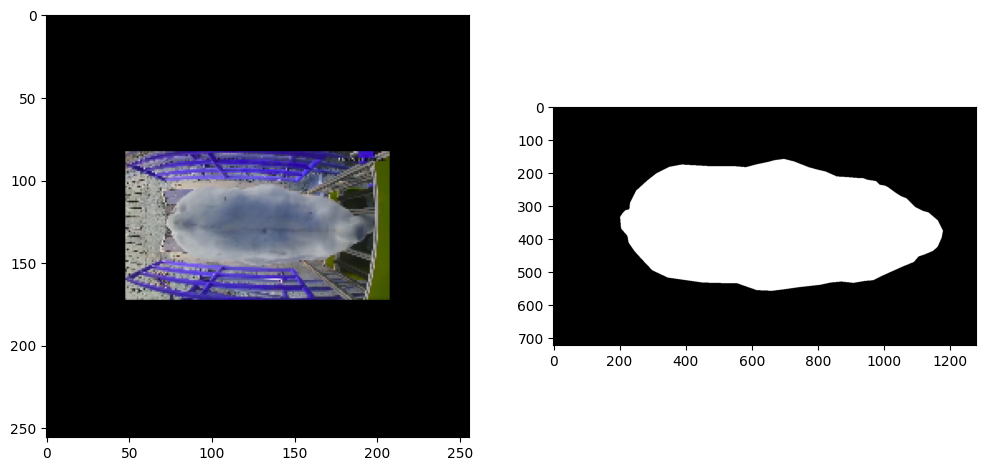

2013-10_dorsal_328.5.png


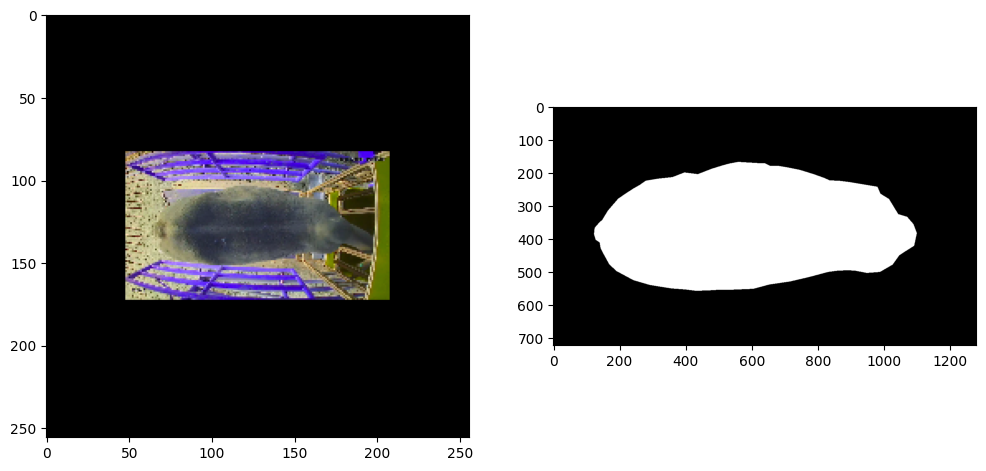

2013-11_dorsal_366.5.png


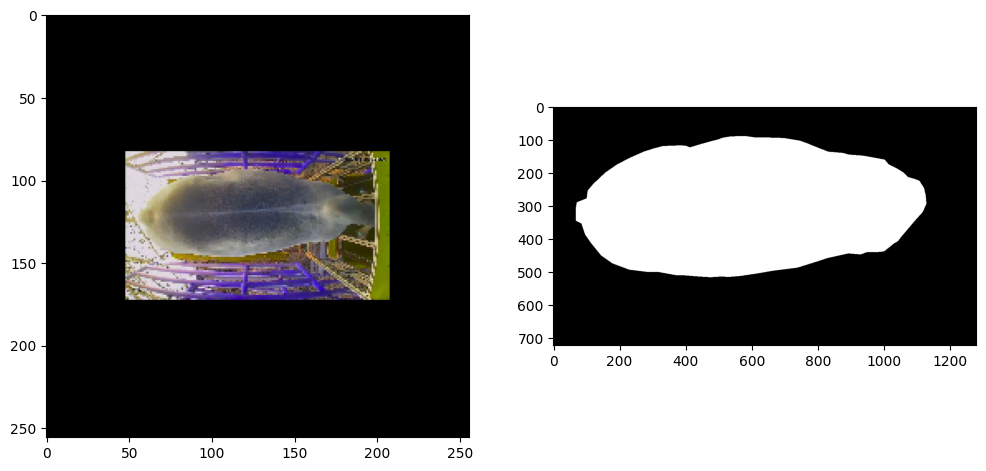

2013-12_dorsal_369.png


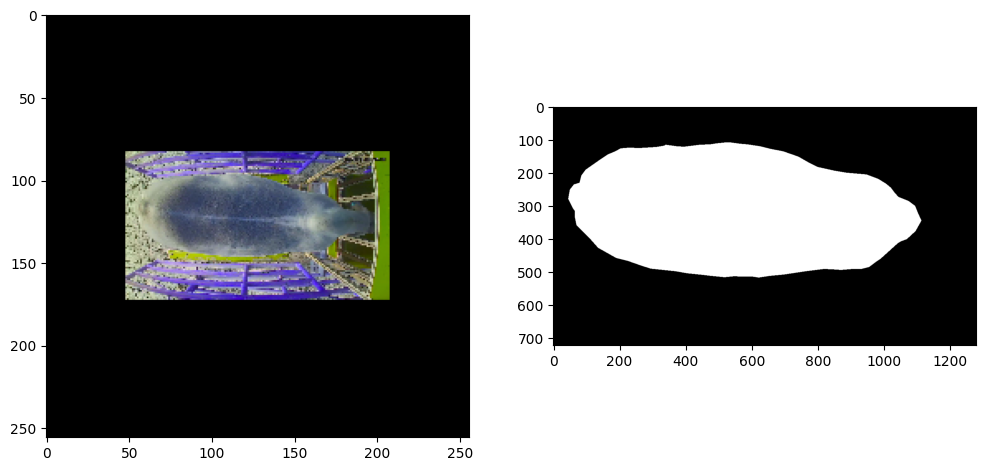

2013-13_dorsal_370.png


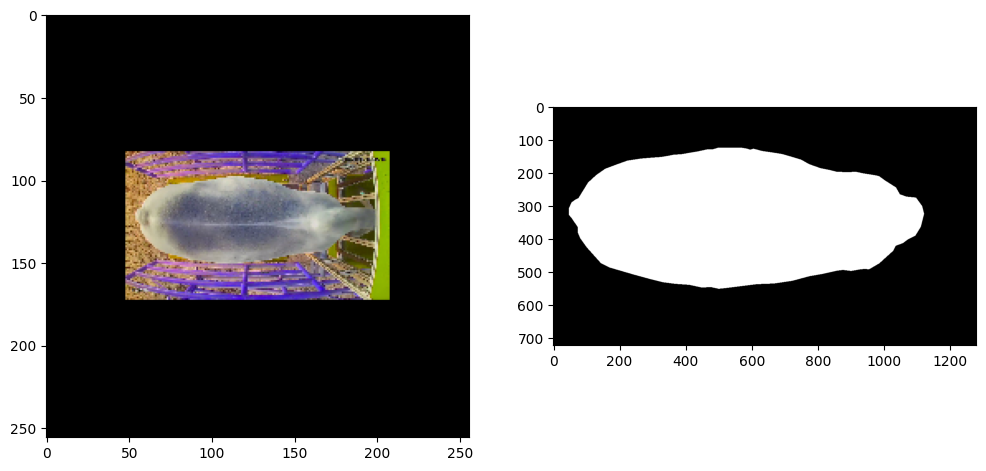

2013-1_dorsal_324.png


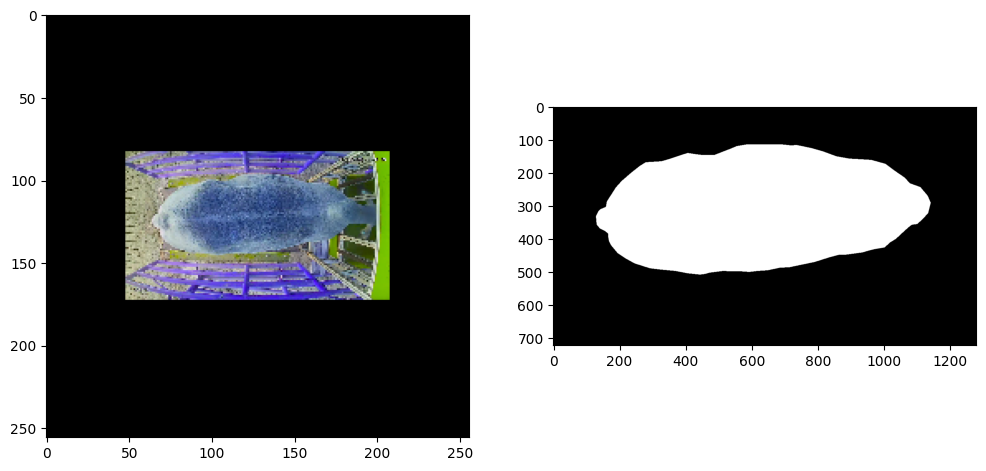

2013-2_dorsal_326.png


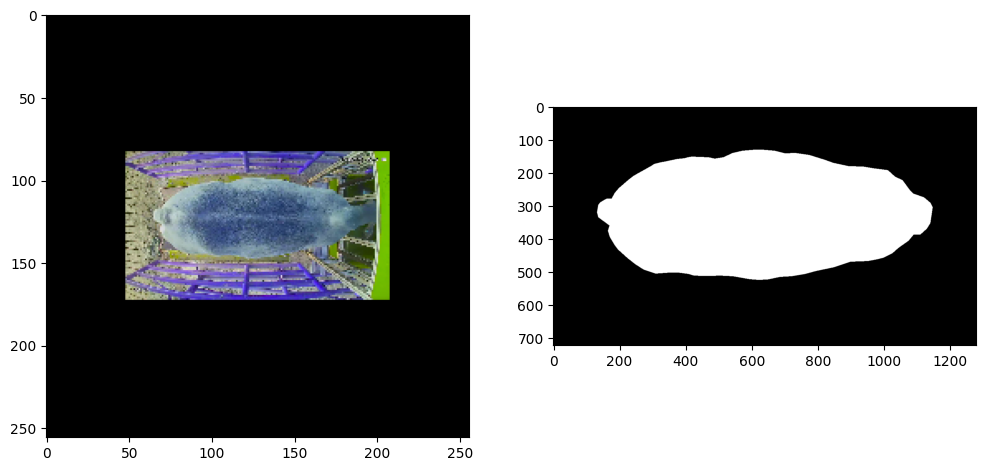

2013-3_dorsal_326.png


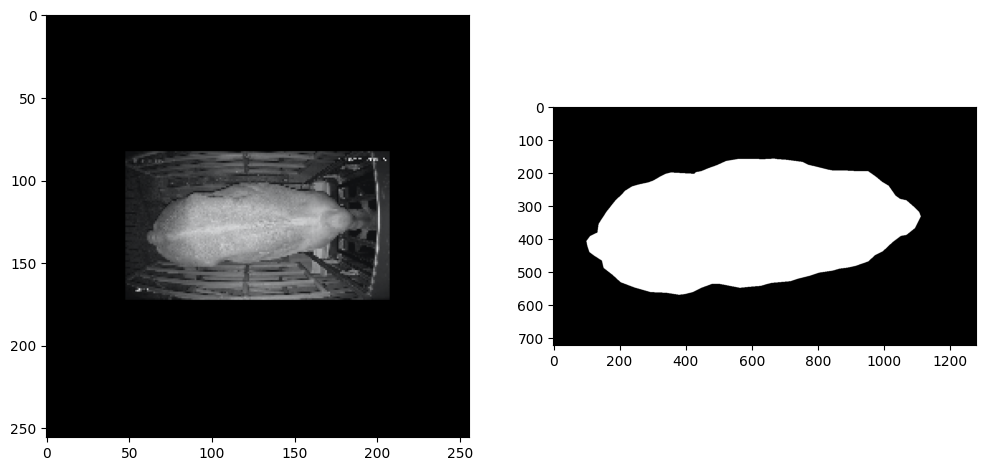

2013-4_dorsal_328.png


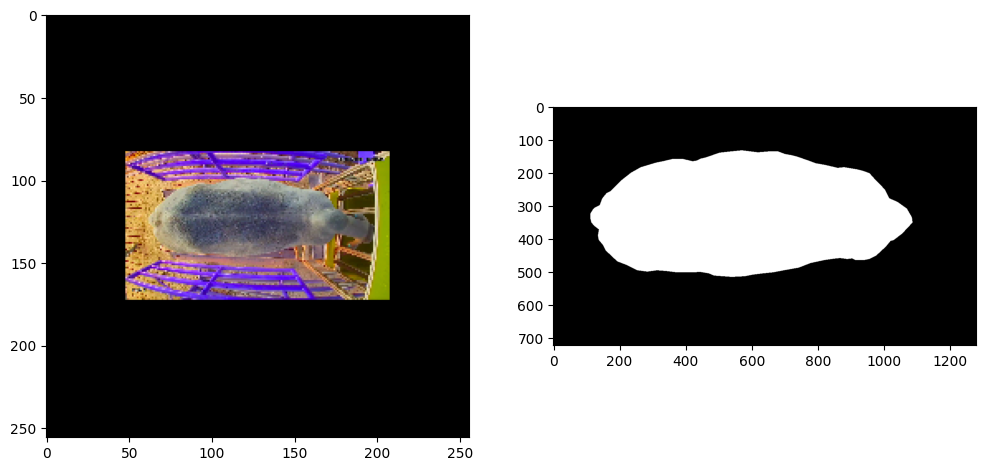

2013-5_dorsal_324.5.png


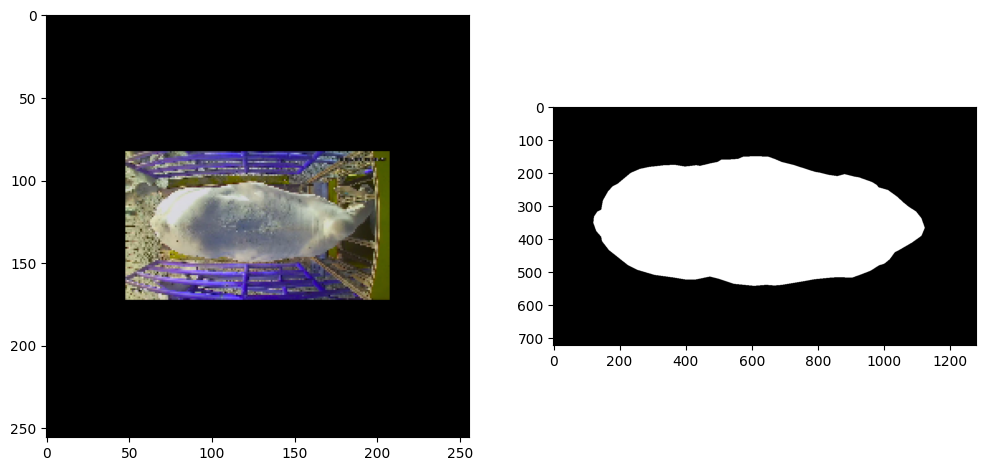

2013-6_dorsal_326.png


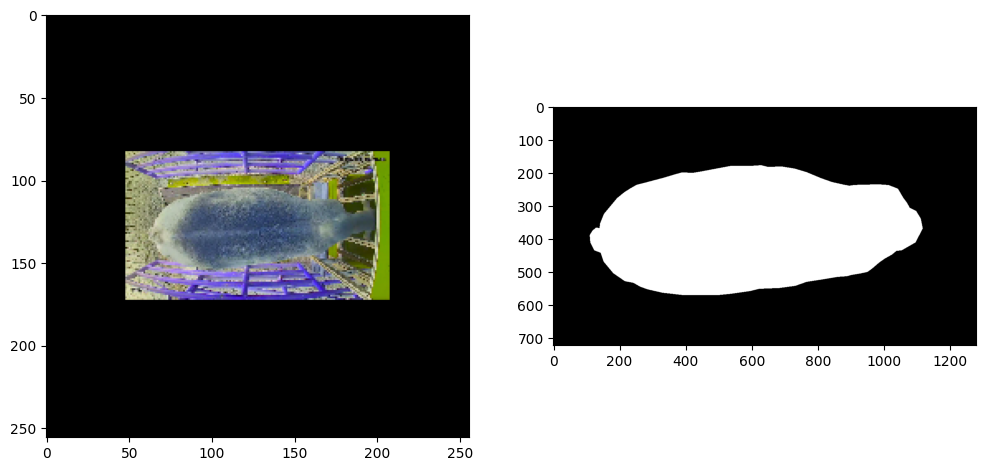

2013-7_dorsal_327.png


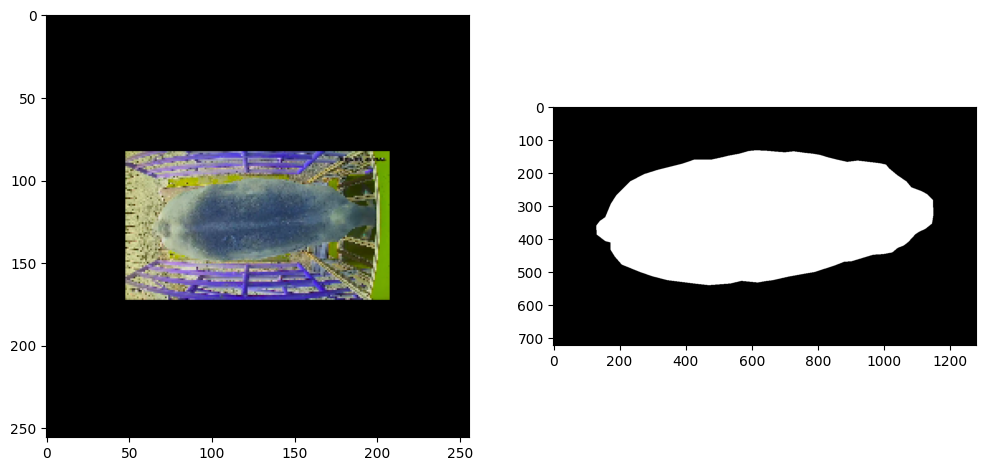

2013-8_dorsal_328.5.png


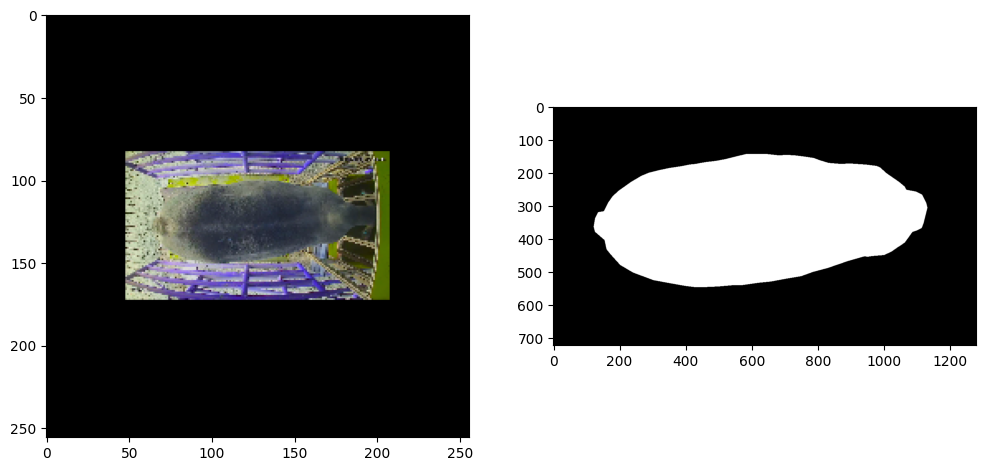

2013-9_dorsal_327.png


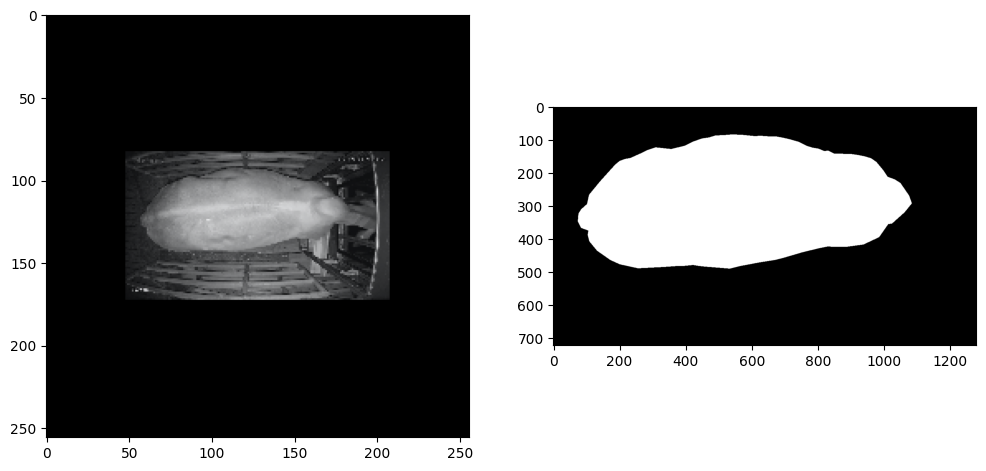

2017-10_dorsal_363.5.png


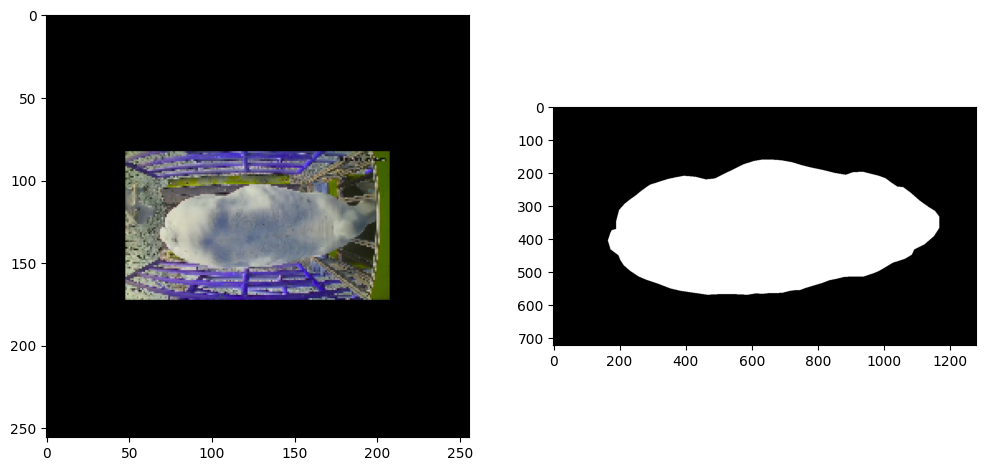

2017-11_dorsal_358.png


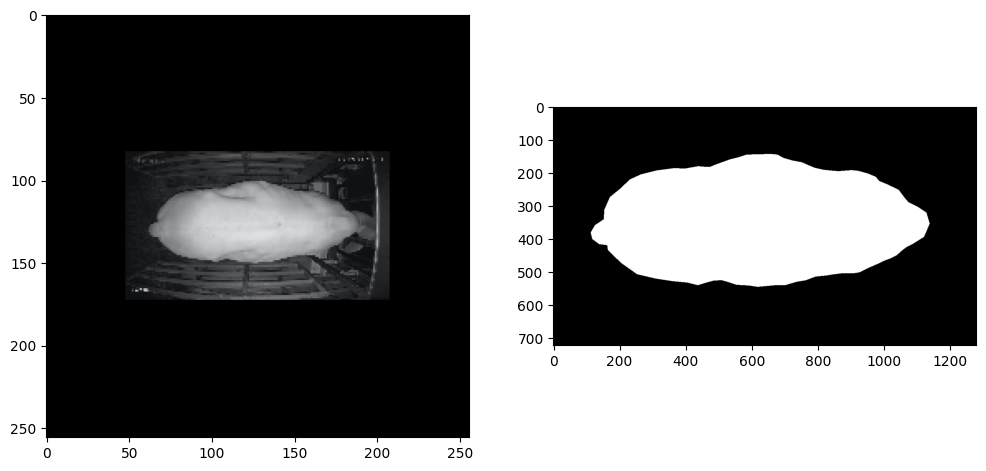

2017-12_dorsal_358.png


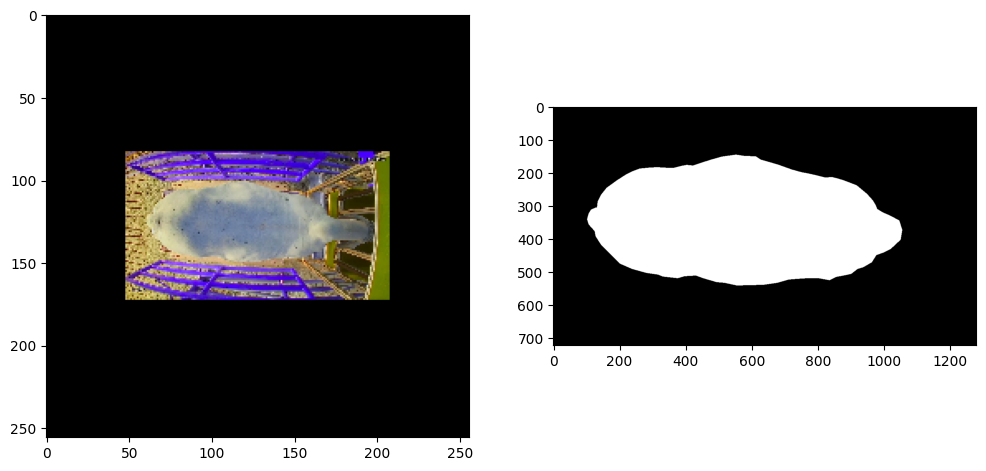

2017-13_dorsal_357.5.png


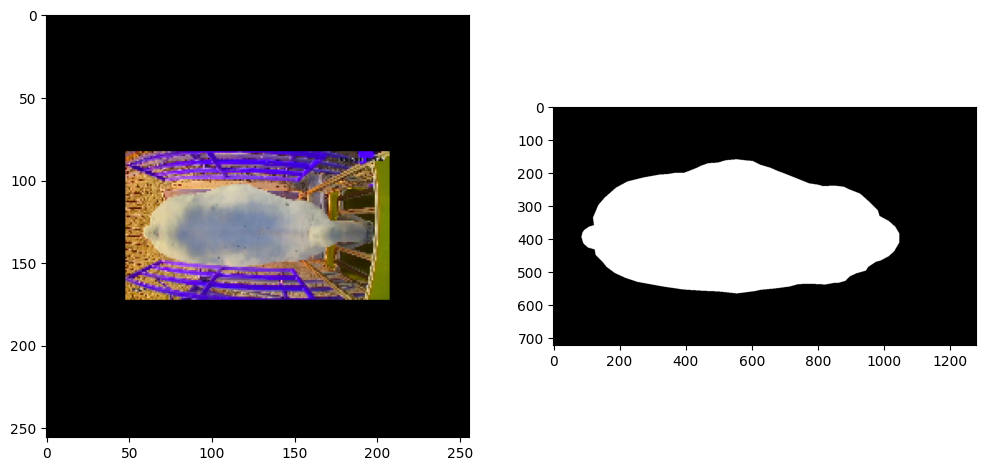

2017-14_dorsal_417.5.png


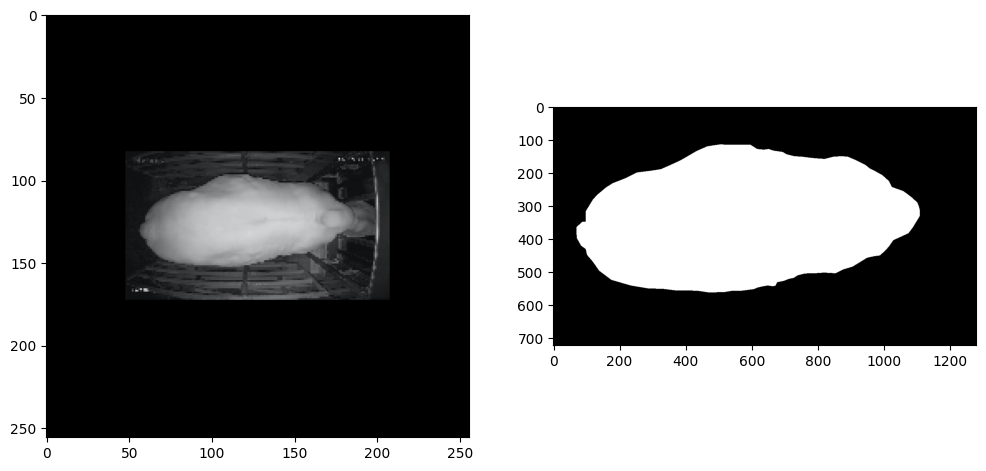

2017-15_dorsal_415.png


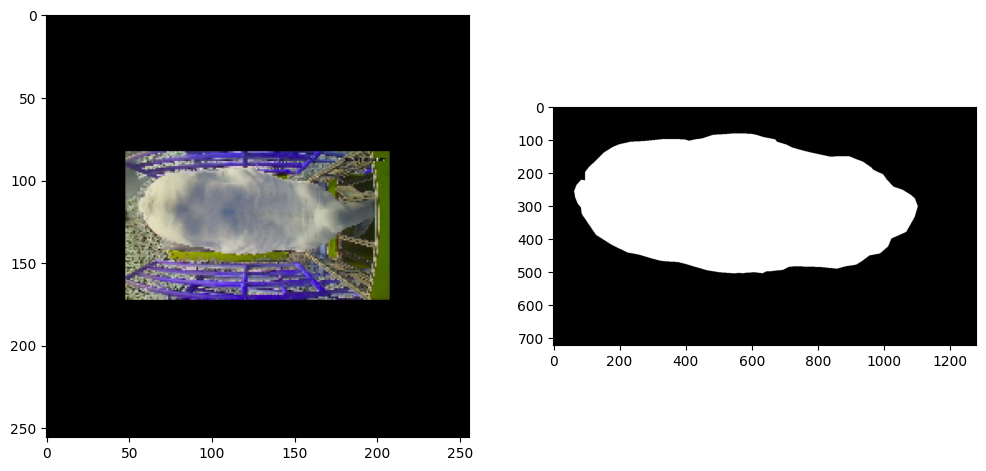

2017-16_dorsal_416.5.png


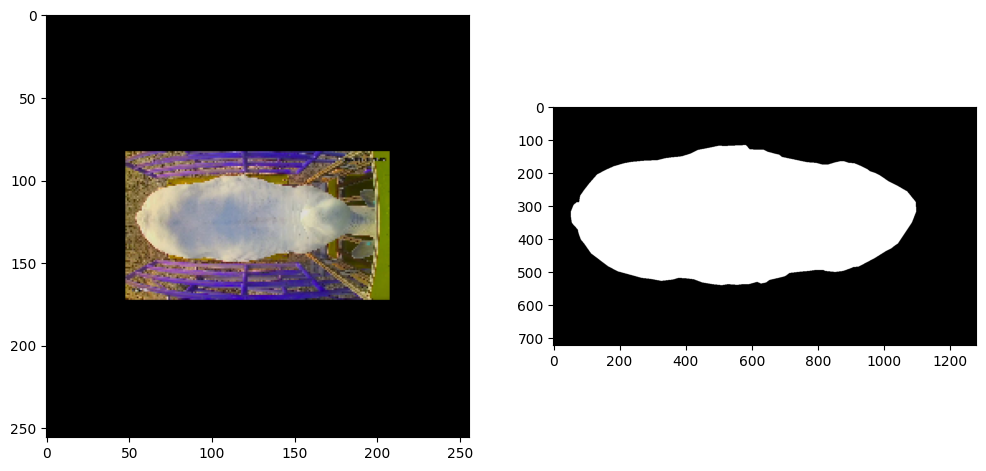

2017-17_dorsal_417.5.png


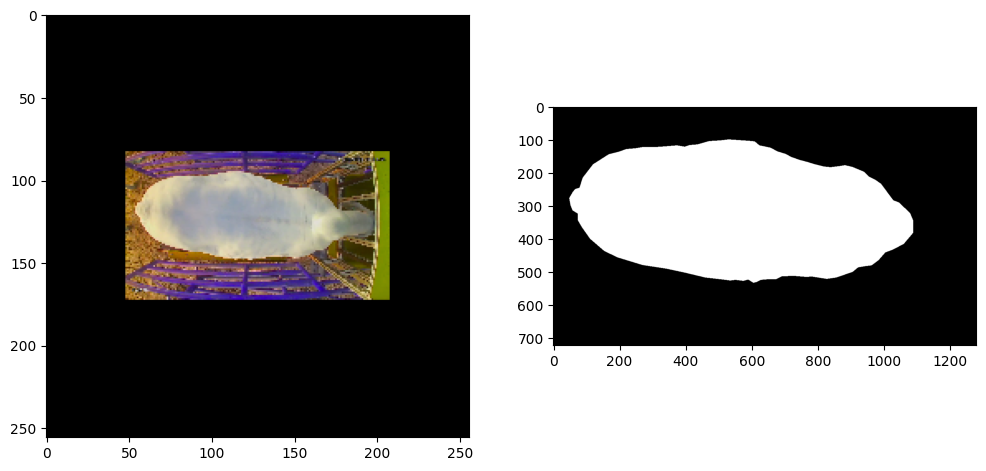

2017-18_dorsal_422.5.png


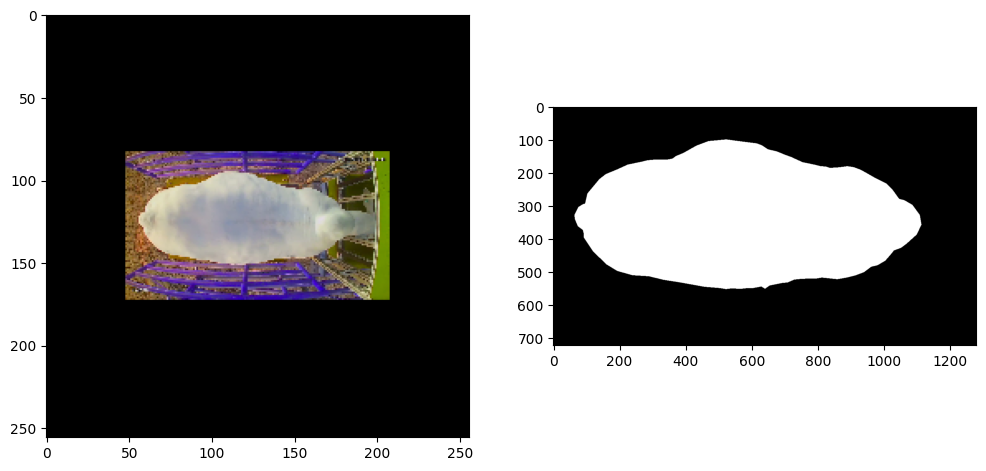

2017-1_dorsal_358.png


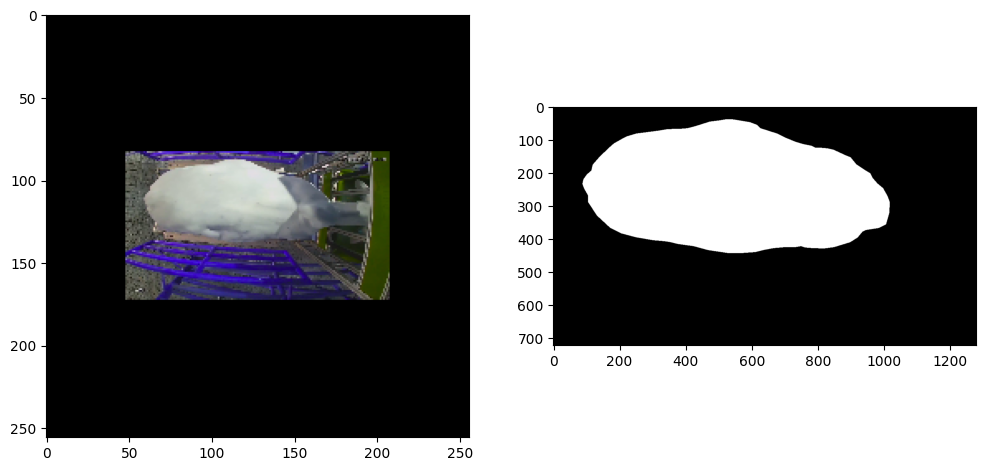

2017-2_dorsal_357.5.png


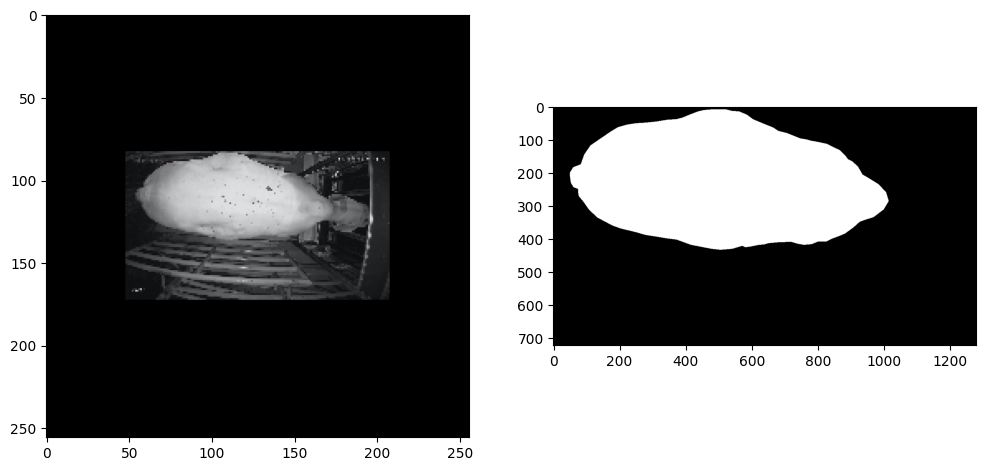

2017-3_dorsal_349.png


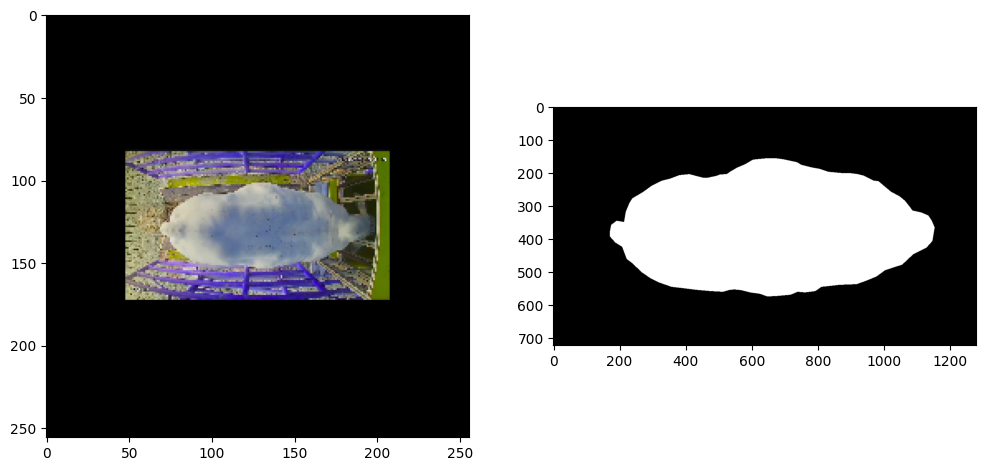

2017-4_dorsal_355.png


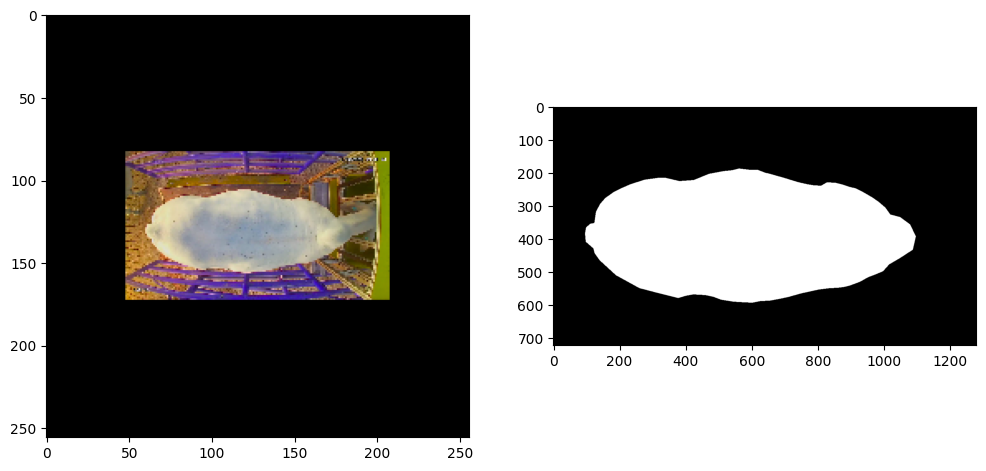

2017-5_dorsal_356.png


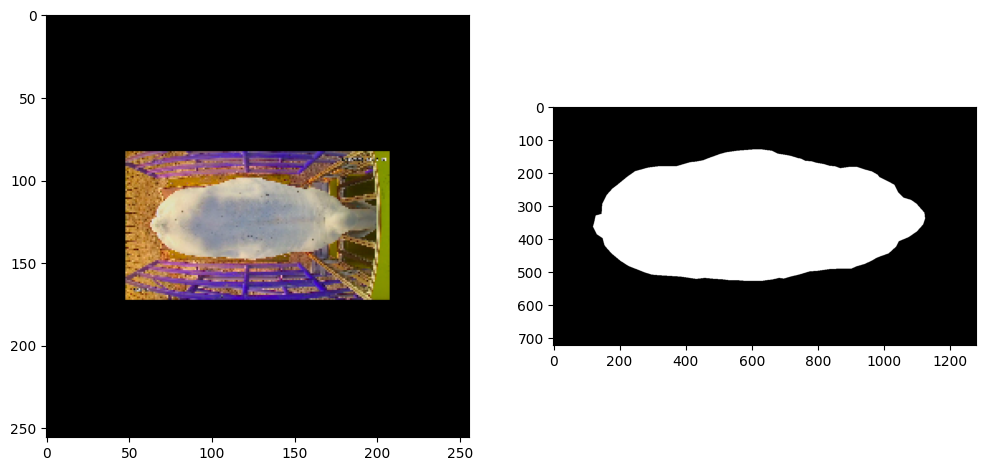

2017-6_dorsal_361.png


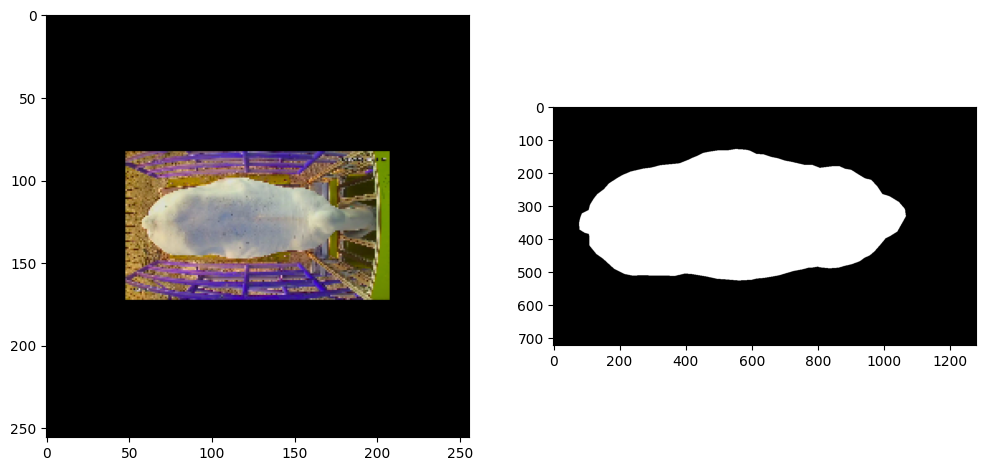

2017-7_dorsal_359.png


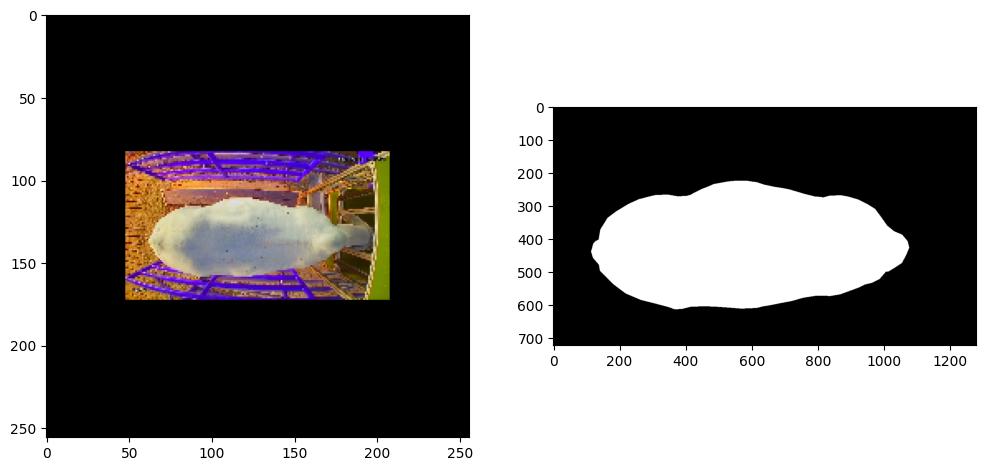

2017-8_dorsal_355.png


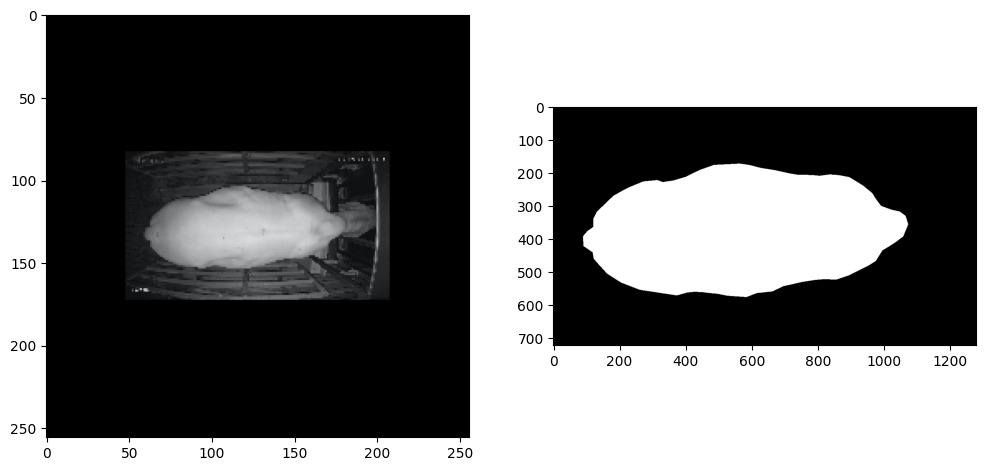

2017-9_dorsal_356.5.png


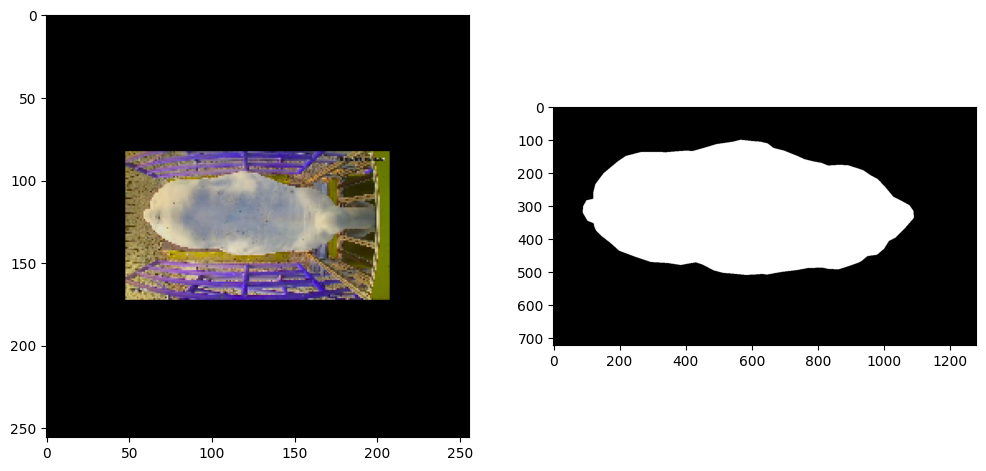

2018-10_dorsal_378.5.png


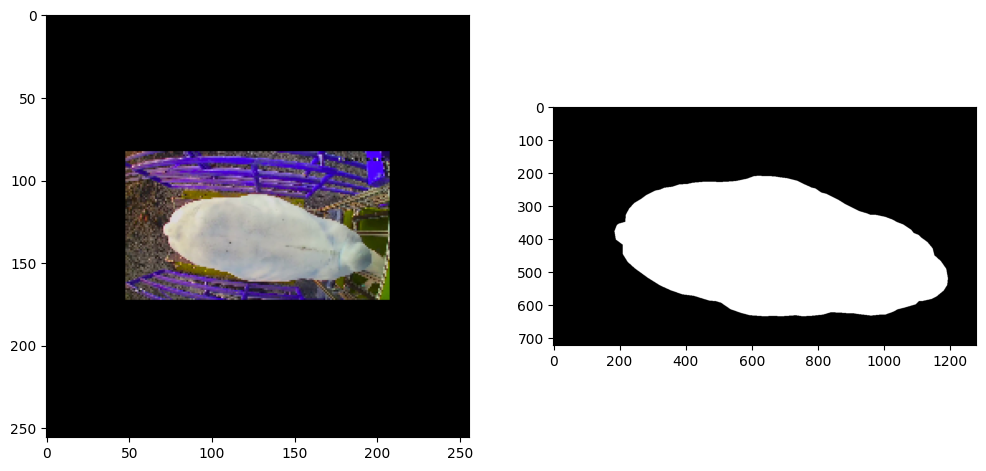

2018-11_dorsal_393.png


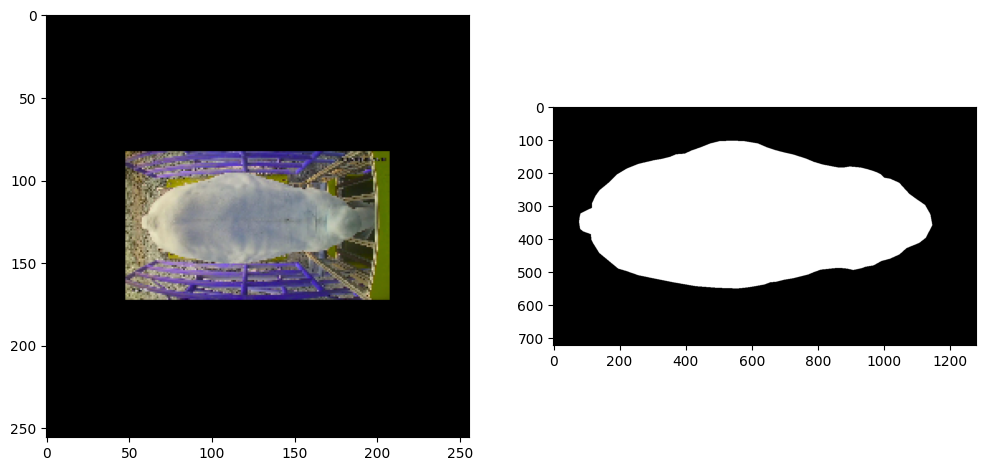

2018-12_dorsal_400.5.png


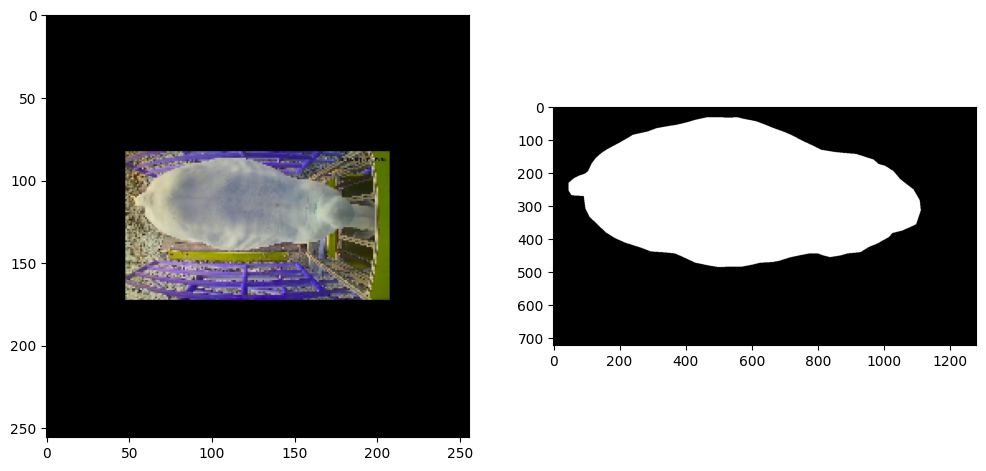

2018-1_dorsal_322.png


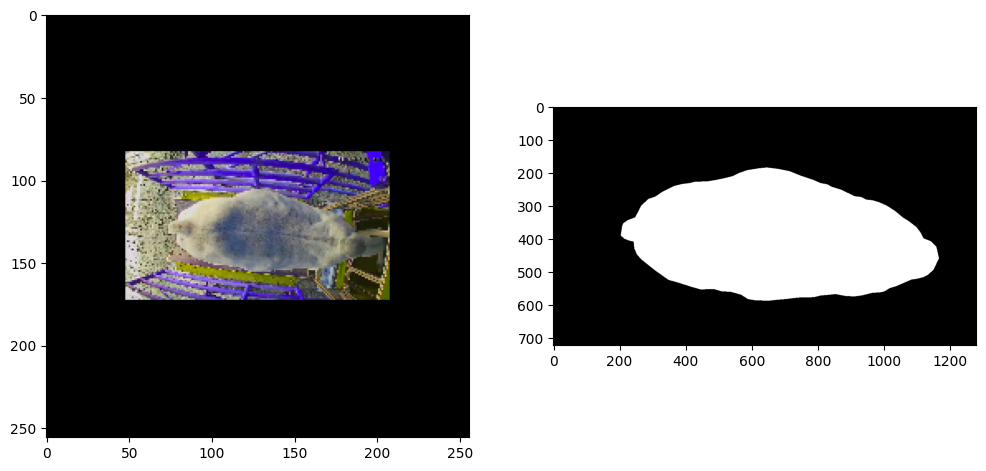

2018-2_dorsal_326.5.png


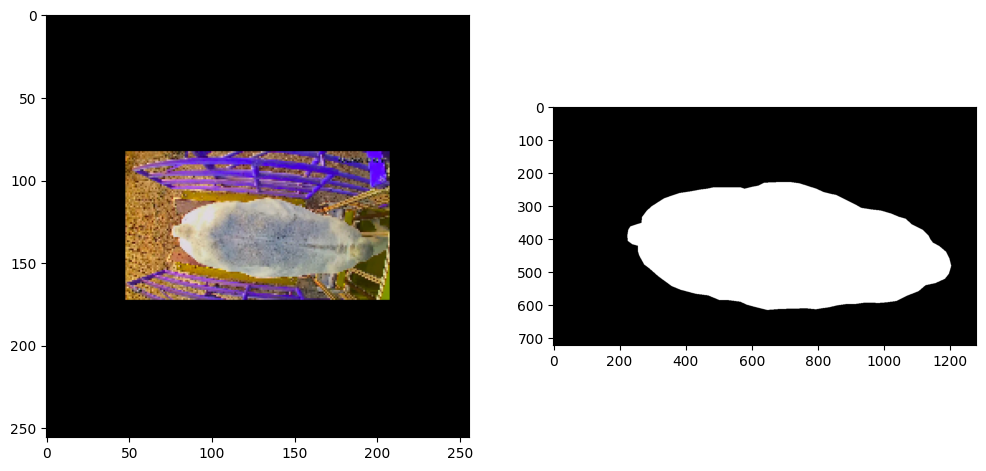

2018-3_dorsal_325.png


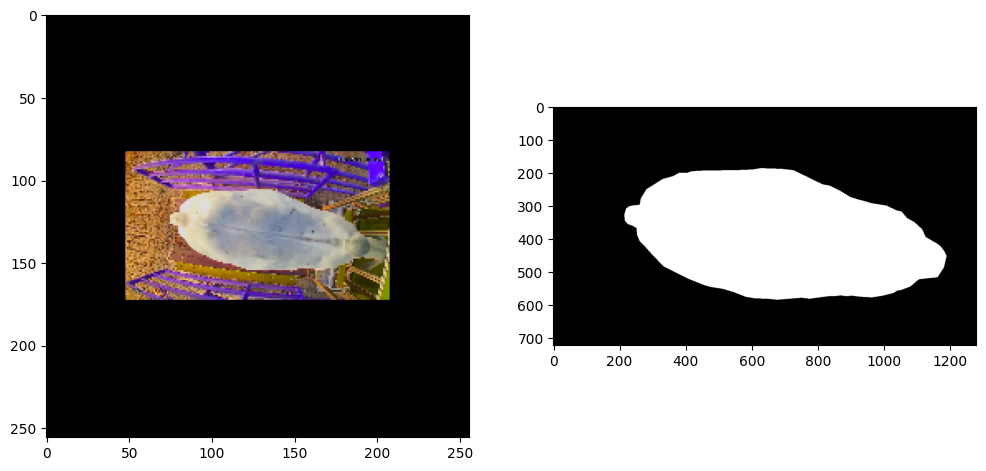

2018-4_dorsal_329.5.png


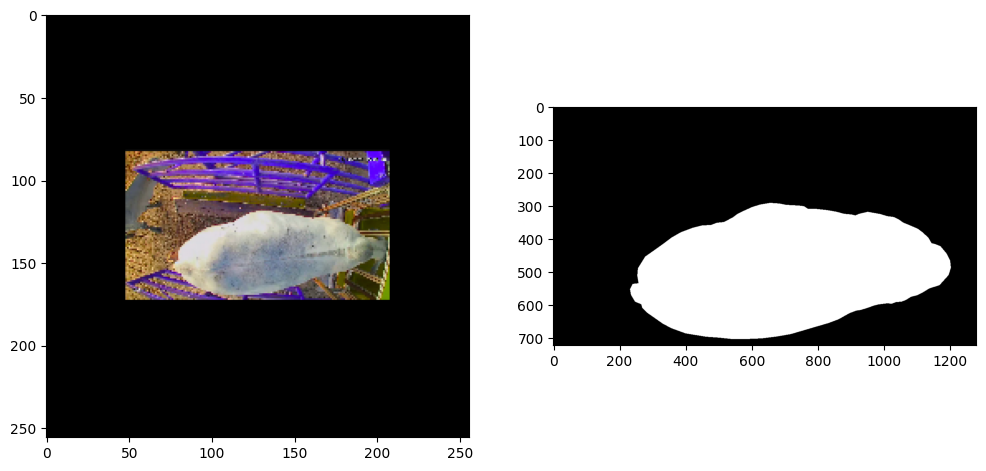

2018-5_dorsal_320.5.png


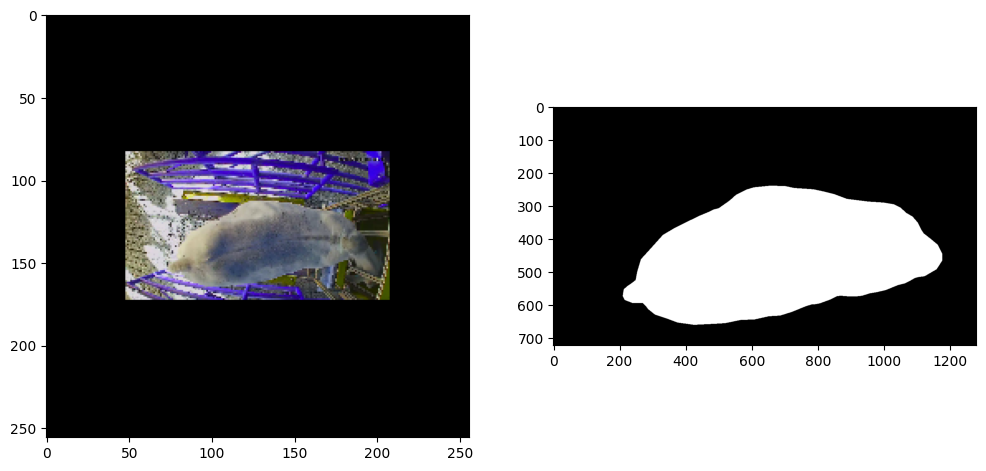

2018-6_dorsal_319.png


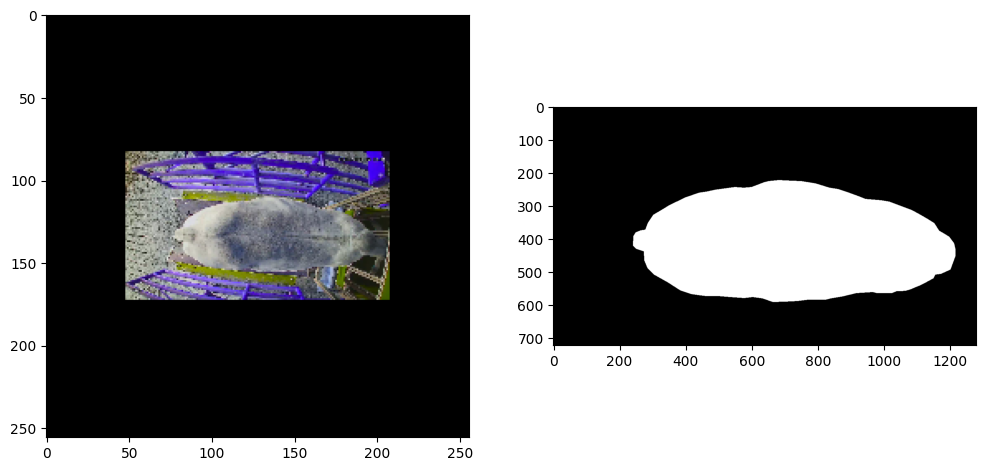

2018-7_dorsal_324.png


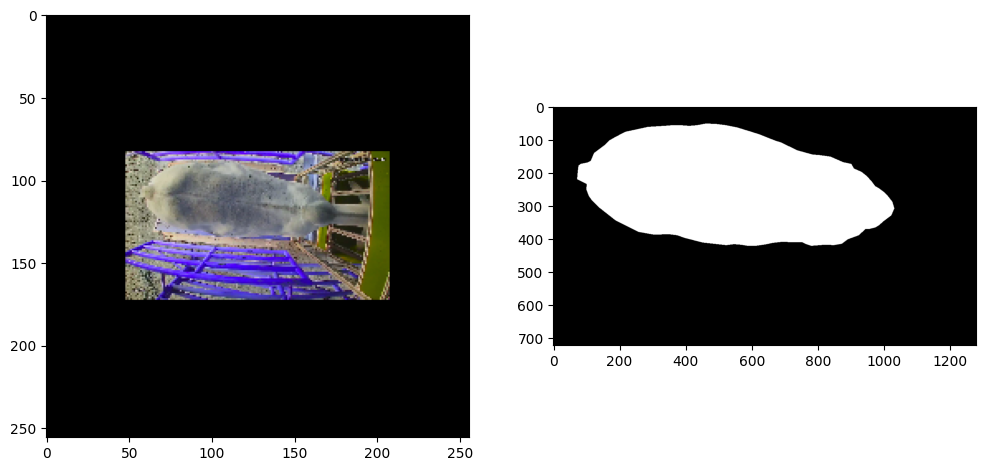

2018-8_dorsal_367.5.png


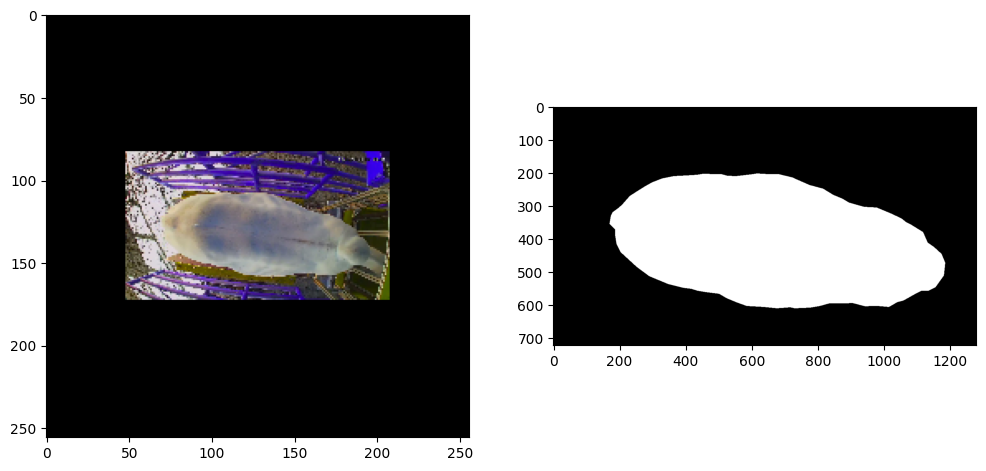

2018-9_dorsal_370.5.png


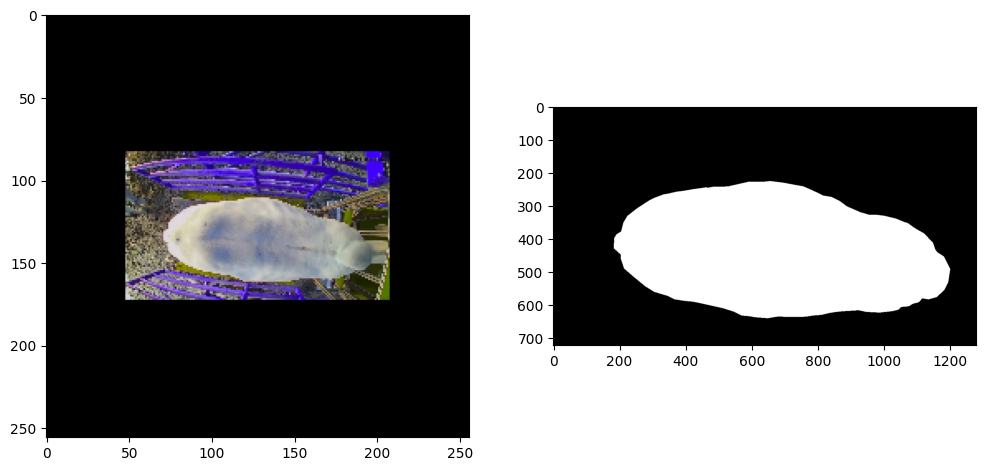

2024-10_dorsal_325.5.png


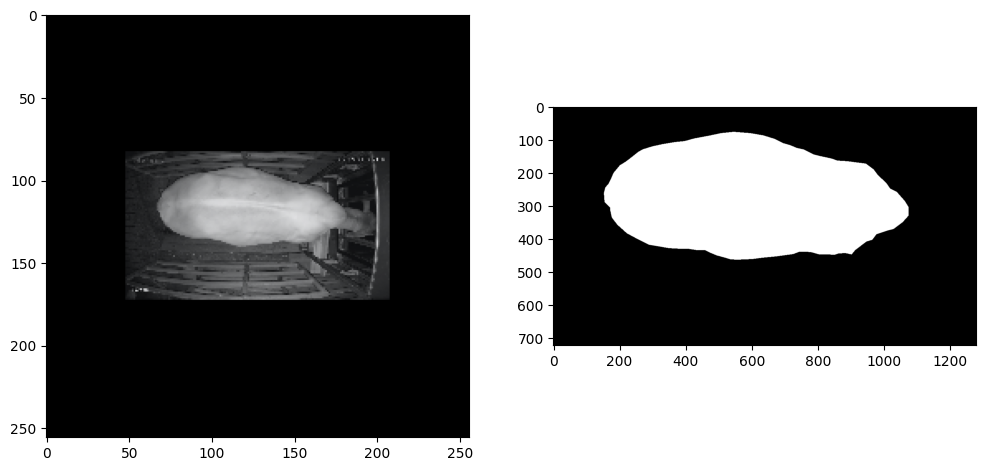

2024-11_dorsal_330.5.png


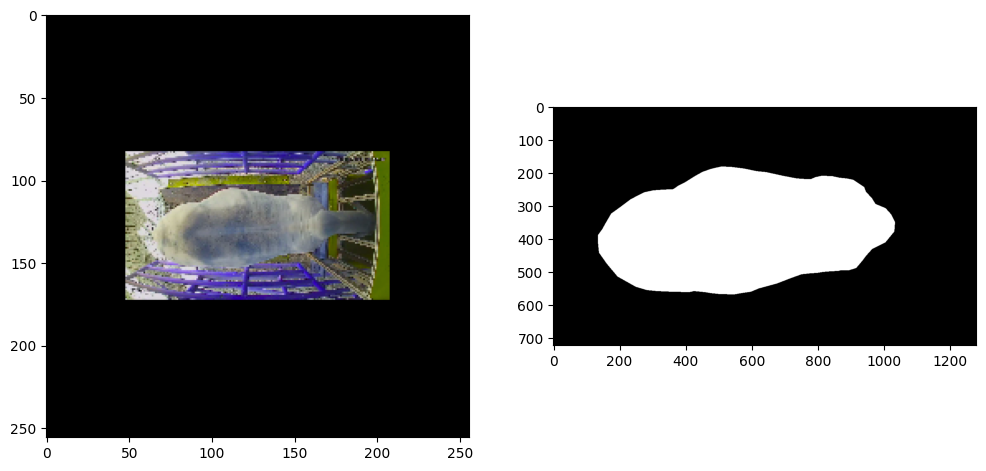

2024-12_dorsal_330.5.png


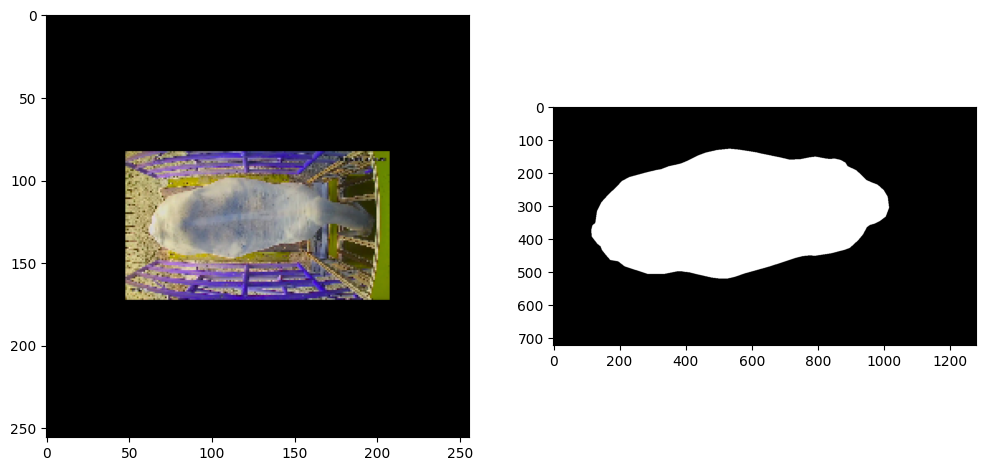

2024-13_dorsal_326.5.png


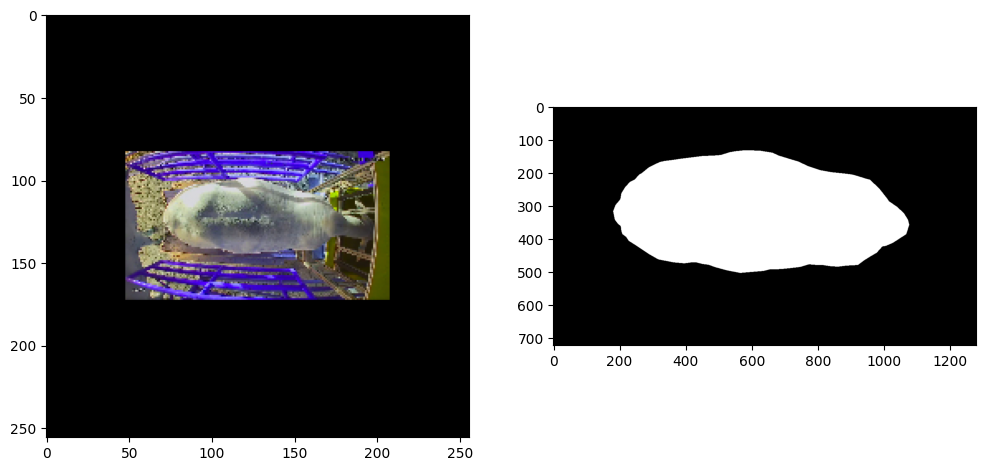

2024-14_dorsal_330.png


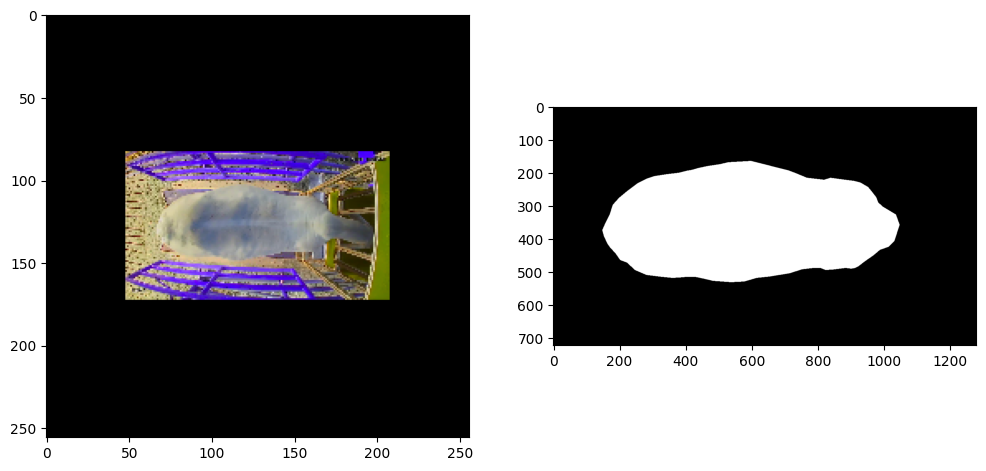

2024-15_dorsal_332.5.png


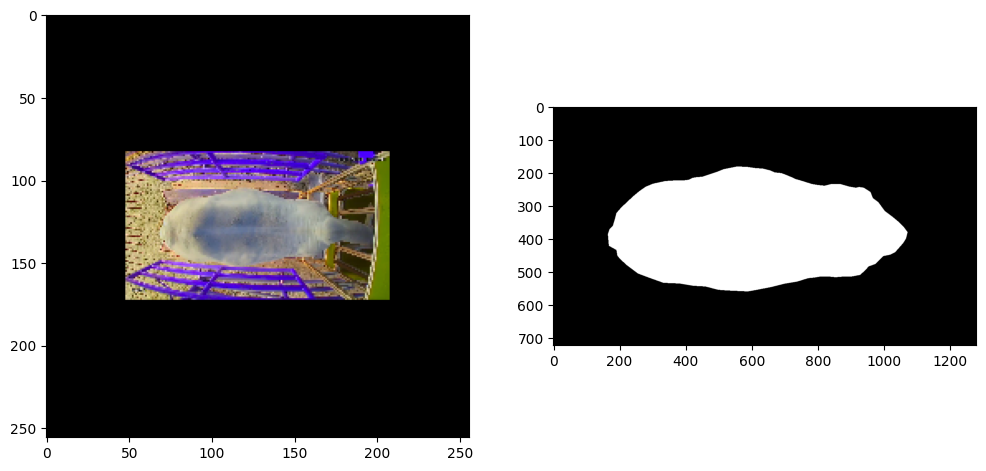

In [ ]:
# import random
for i in range(0,50):
  print(Y_ids[i])
# image_number = random.randint(0,len(X_train)-1)
  plt.figure(figsize=(12,6))
  plt.subplot(121)
  plt.imshow(X[i], cmap= 'gray')
  plt.subplot(122)
  plt.imshow(Y[i], cmap= 'gray')
  plt.show()

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/cdc-zoo/2022/dataset/dorsal/models/150_epochs_animalHouse_154images_best_earlystopping_15_06_24.keras',compile=False)

In [ ]:
y_pred = model.predict(X)
y_pred_thresholded = y_pred>0.5

8/8 [==============================] - 4s 533ms/step


In [ ]:
import cv2
import numpy as np
from PIL import Image

# Supondo que y_pred_thresholded seja a sua lista de máscaras
bkp_masks = []

# Substring a ser adicionada
substring = "_mask"

# Iterar sobre os nomes de arquivos e adicionar a substring
modified_names = []
for name in X_ids:
    # Separar o nome da imagem e a extensão
    name_without_extension = name.rsplit('.', 1)[0]
    extension = name.rsplit('.', 1)[1]

    # Adicionar a substring entre o nome e a extensão
    new_name = f"{name_without_extension}{substring}.{extension}"

    # Adicionar o novo nome à lista de nomes modificados
    modified_names.append(new_name)



for i, mask in enumerate(y_pred_thresholded):
    # Convertendo a máscara do PIL para um array NumPy
    mask = np.array(Image.fromarray(np.squeeze(mask)))
    mask = mask.astype(np.uint8)

    thresh = cv2.adaptiveThreshold(mask, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

    # Encontrando contornos na imagem
    contornos, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Criando uma máscara vazia
    mascara = np.zeros_like(mask)
    # Desenhando os contornos na máscara
    cv2.drawContours(mascara, contornos, -1, (255), thickness=cv2.FILLED)

    # Certifique-se de que a máscara está no formato correto (por exemplo, uint8)

    # Encontrar contornos na máscara
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Encontrar o maior contorno
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)

        # Criar uma imagem preta e branca com o contorno
        black_white_image = np.zeros_like(mask)
        cv2.drawContours(black_white_image, [largest_contour], -1, (255), thickness=cv2.FILLED)

        # Redimensionar a imagem preta e branca para 1280x720
        original_image = cv2.resize(black_white_image, (2048, 2048))
        original_image = original_image[664:1384,384:1664]

        # Creating kernel
        kernel = np.ones((5, 5), np.uint8)

        # Using cv2.erode() method
        original_image = cv2.erode(original_image, kernel, iterations=5)

        bkp_masks.append(original_image)



#Exibindo resultados

In [ ]:
from keras.metrics import MeanIoU
bkp_masks = np.array(bkp_masks)
bkp_masks = np.where(bkp_masks != 0, 1, 0)
Y = np.where(Y != 0, 1, Y)
print(np.unique(bkp_masks))
print(np.unique(Y))
n_classes = 2
IOU_keras = MeanIoU(num_classes = n_classes)
IOU_keras.update_state(bkp_masks,Y)
print("Mean IoU =", IOU_keras.result().numpy())

[0 1]
[0 1]
Mean IoU = 0.4989063


In [ ]:
print(bkp_masks.shape)
print(Y.shape)

(239, 720, 1280)
(239, 720, 1280)


In [ ]:
import numpy as np

def calculate_iou(pred_mask, true_mask):
    # Calcular a interseção e a união
    intersection = np.logical_and(pred_mask, true_mask).sum()
    union = np.logical_or(pred_mask, true_mask).sum()

    # Evitar divisão por zero
    if union == 0:
        return 0.0

    return intersection / union

def mean_iou(pred_masks, true_masks):
    ious = []
    for pred_mask, true_mask in zip(pred_masks, true_masks):
        iou = calculate_iou(pred_mask, true_mask)
        ious.append(iou)

    return np.mean(ious)

# Calcular o IoU médio
mean_iou_value = mean_iou(bkp_masks, Y)
print("Mean IoU =", mean_iou_value)


Mean IoU = 0.7901838474211711


2087-11_dorsal_343.png


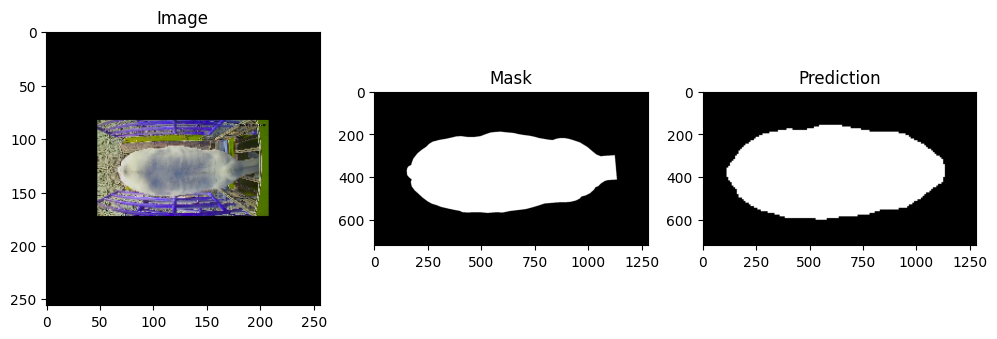

2087-12_dorsal_346.png


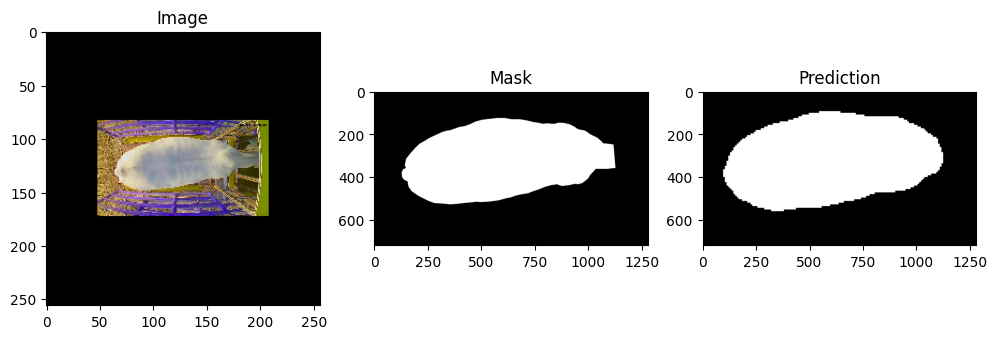

2087-13_dorsal_348.5.png


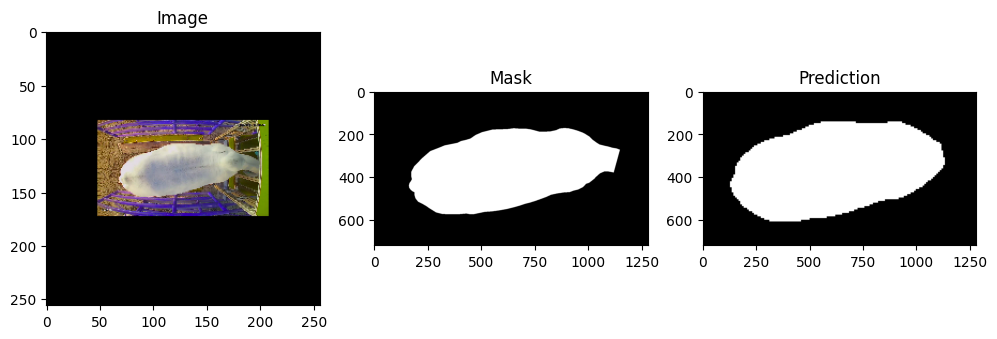

2087-14_dorsal_351.png


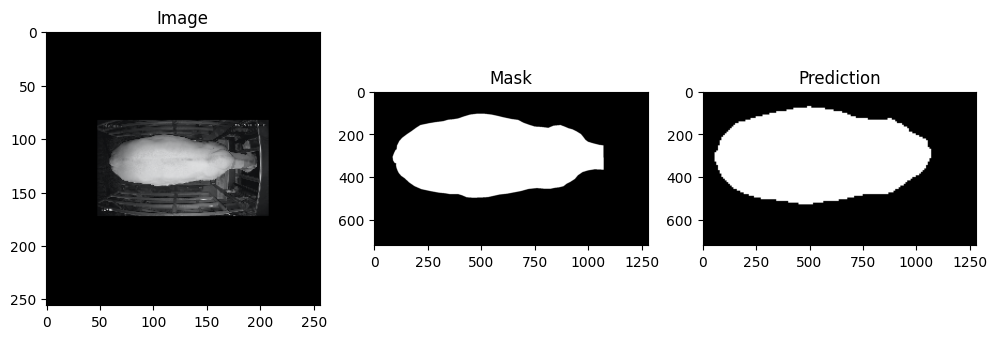

2087-1_dorsal_303.5.png


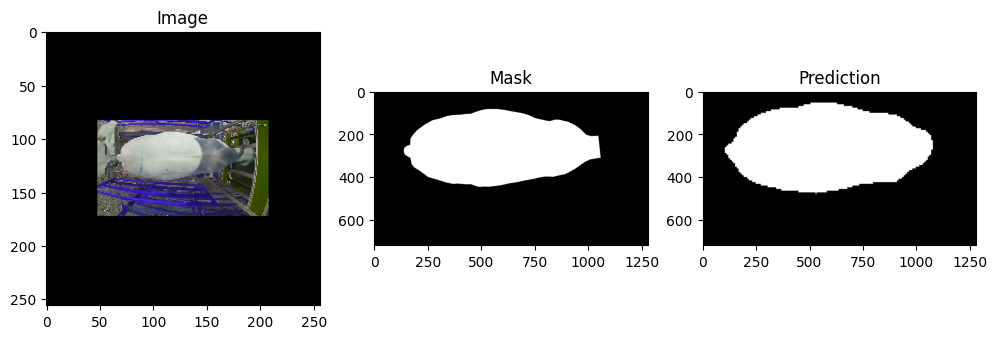

2087-2_dorsal_295.png


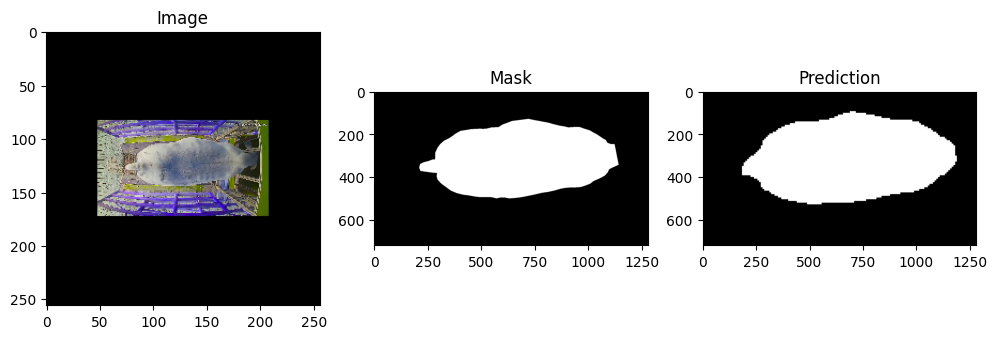

2087-3_dorsal_300.5.png


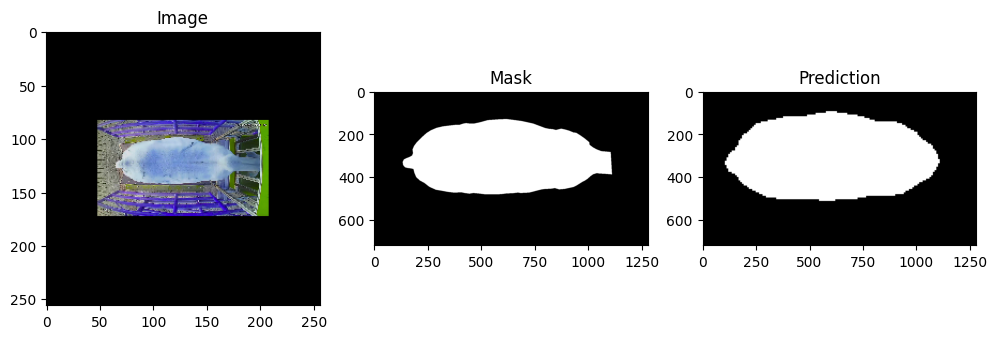

2087-4_dorsal_301.png


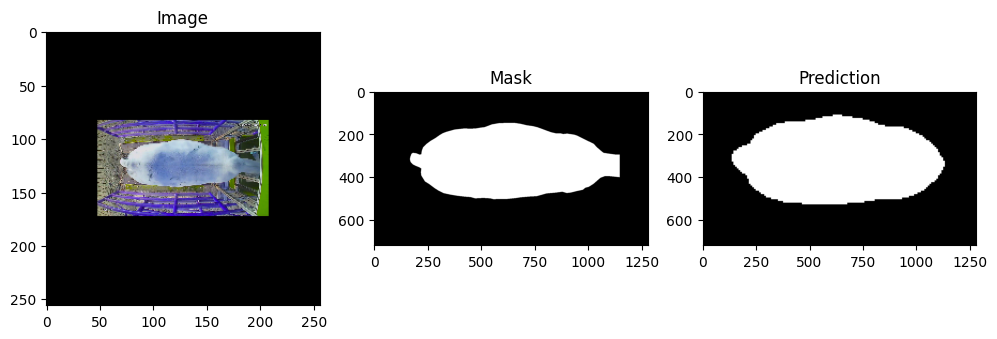

2087-5_dorsal_301.png


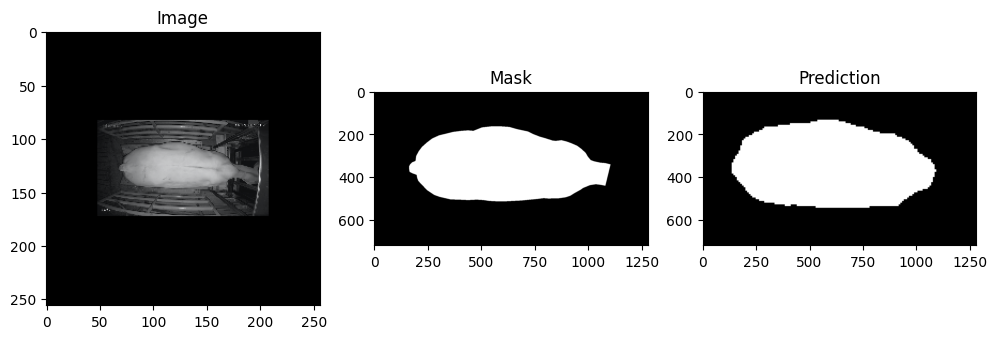

2087-6_dorsal_299.5.png


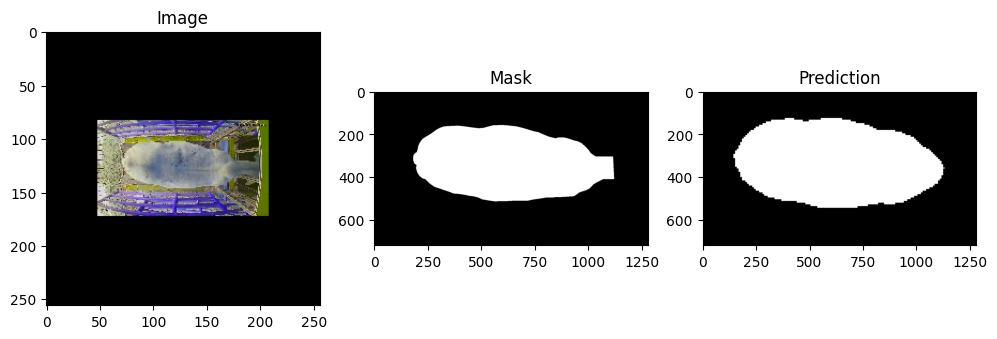

2087-7_dorsal_304.png


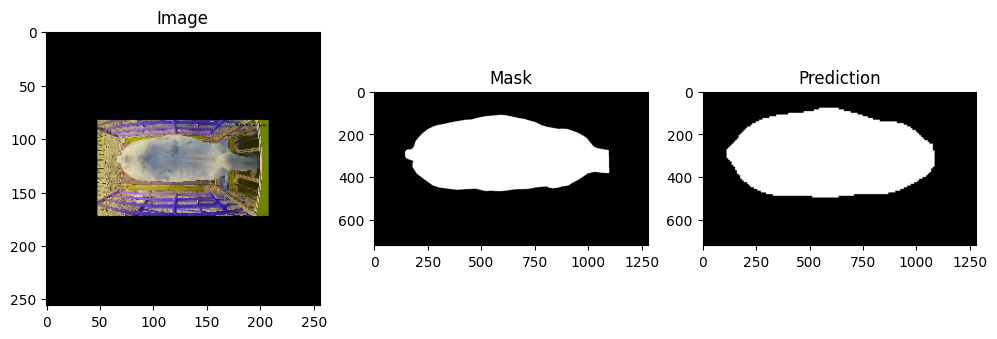

2087-8_dorsal_306.png


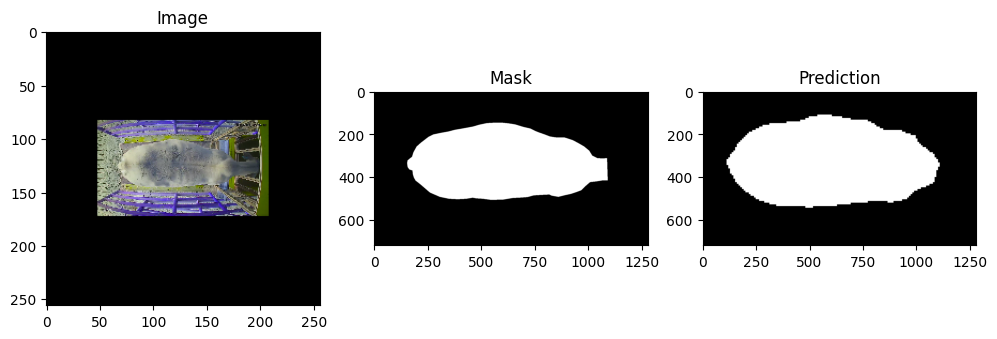

2087-9_dorsal_301.png


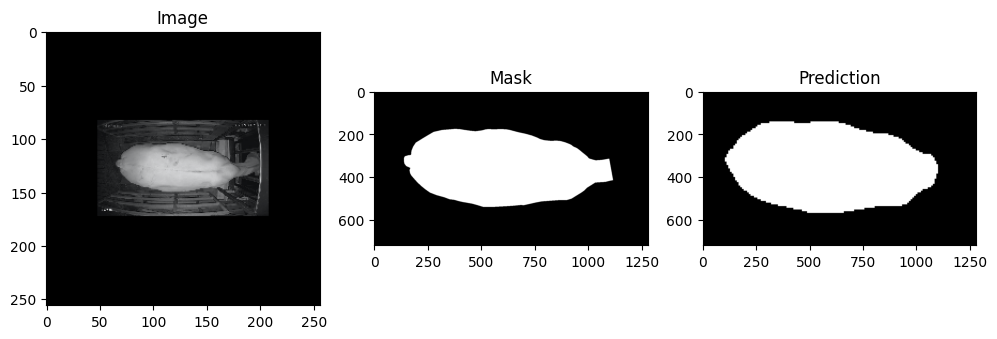

2089-10_dorsal_291.5.png


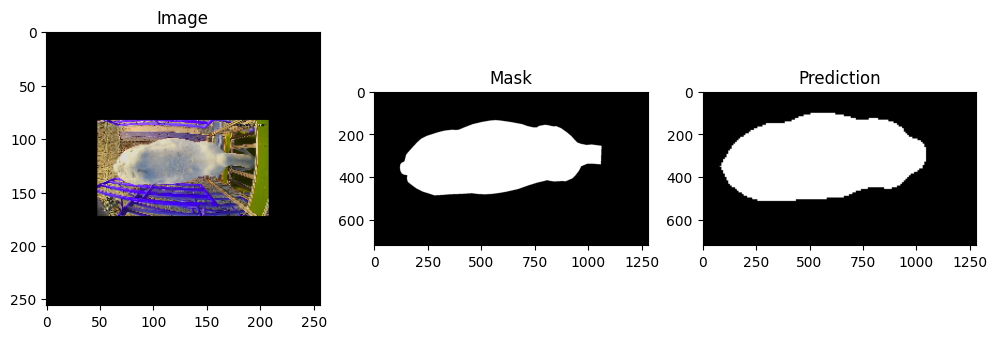

2089-11_dorsal_291.5.png


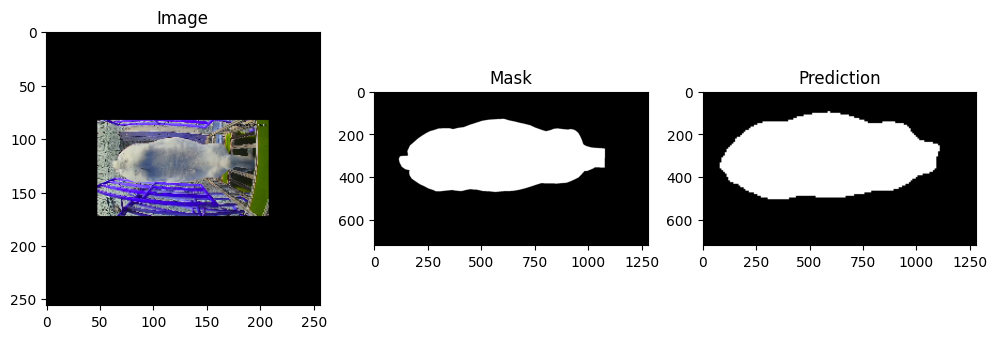

2089-12_dorsal_330.5.png


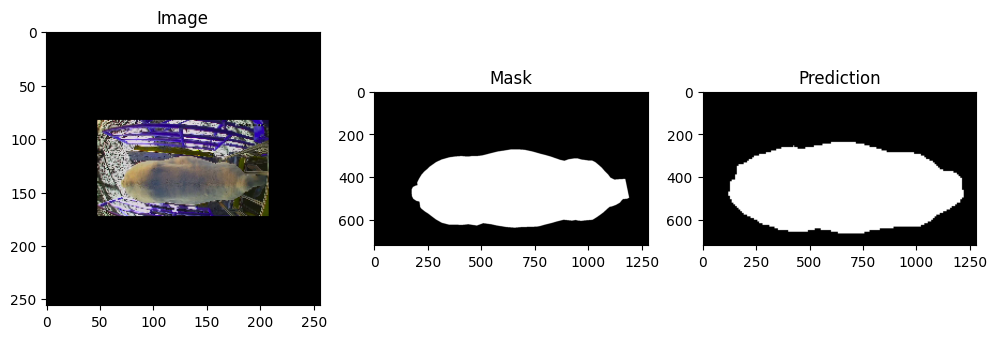

2089-13_dorsal_334.png


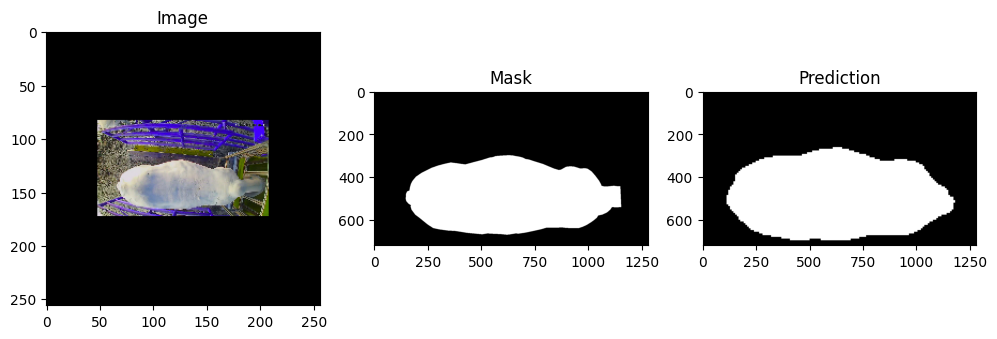

2089-14_dorsal_342.5.png


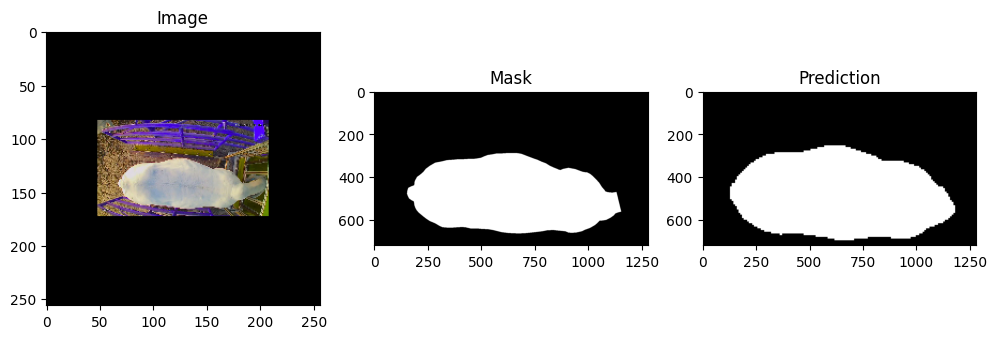

2089-15_dorsal_343.5.png


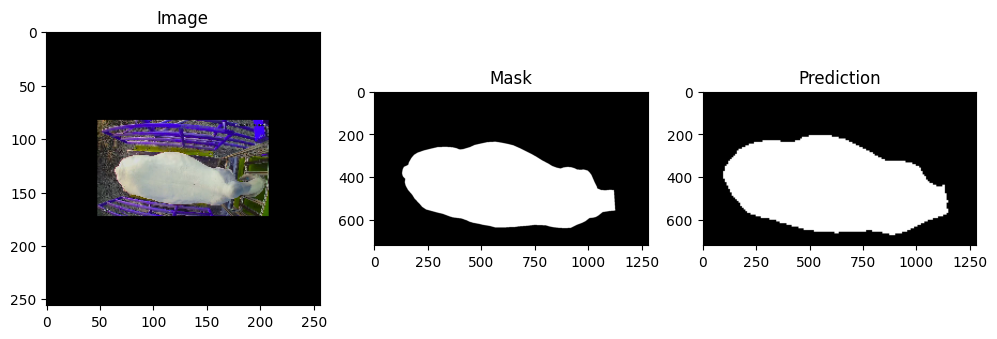

2089-16_dorsal_362.5.png


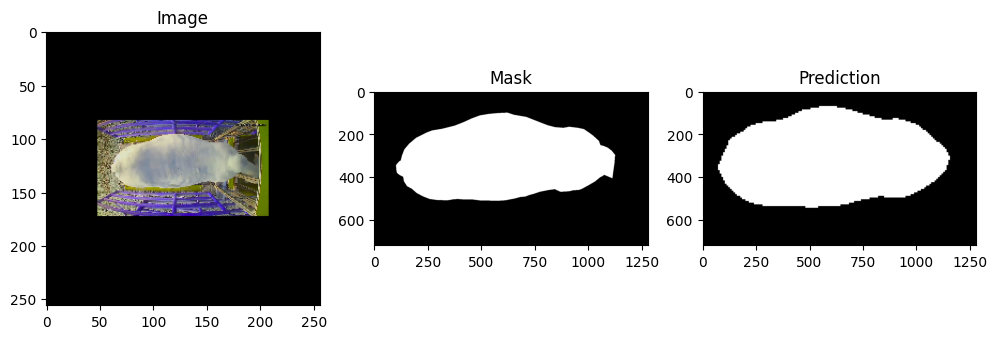

2089-17_dorsal_367.png


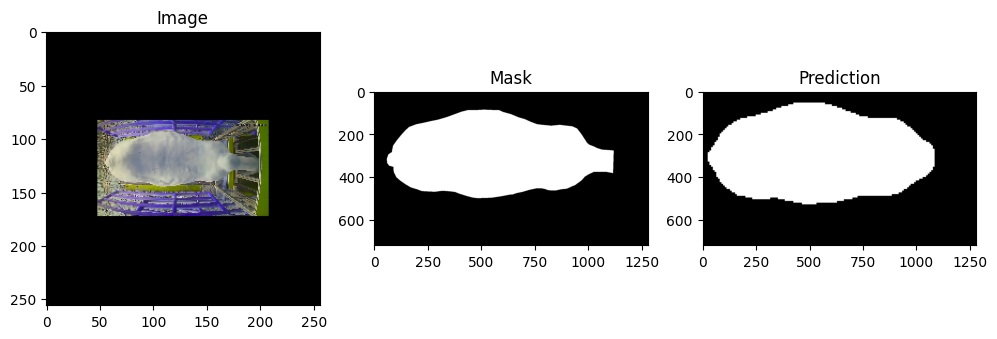

2089-18_dorsal_372.png


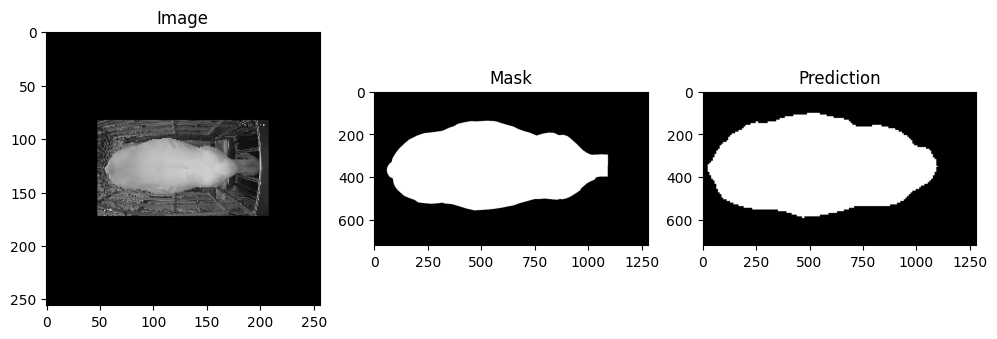

2089-19_dorsal_374.5.png


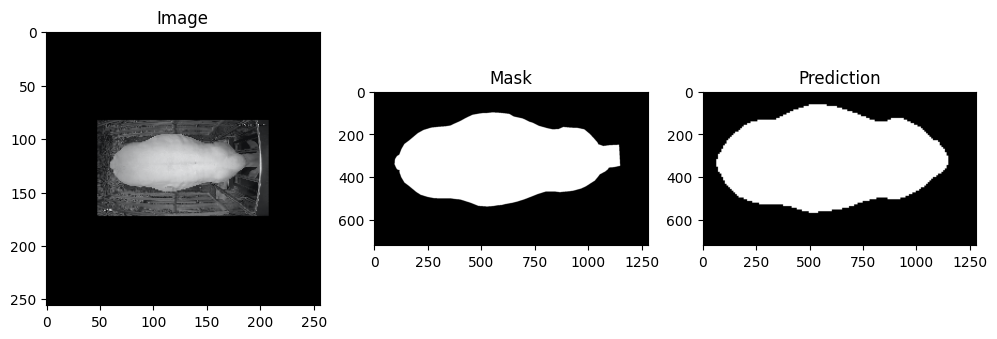

2089-1_dorsal_283.5.png


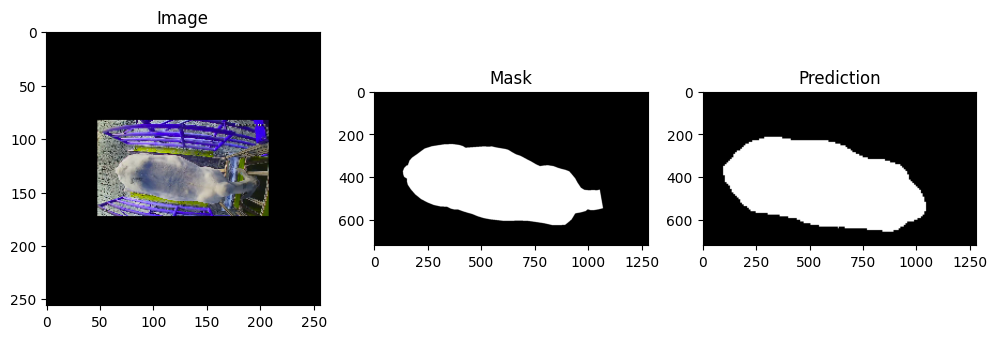

2089-2_dorsal_279.png


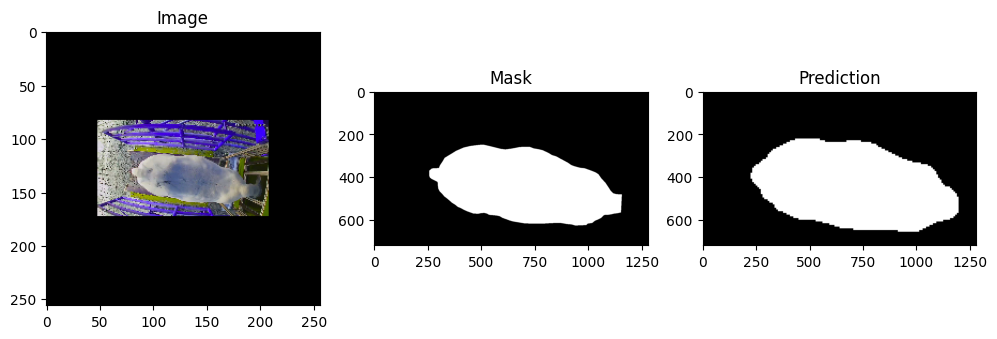

2089-3_dorsal_288.5.png


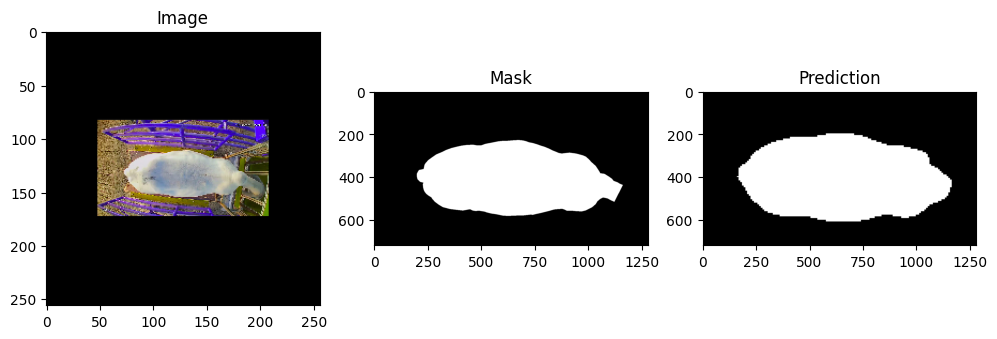

2089-4_dorsal_290.png


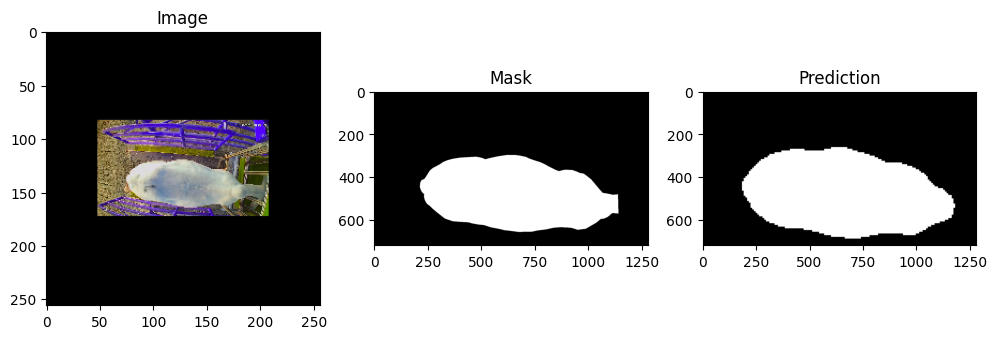

2089-5_dorsal_289.png


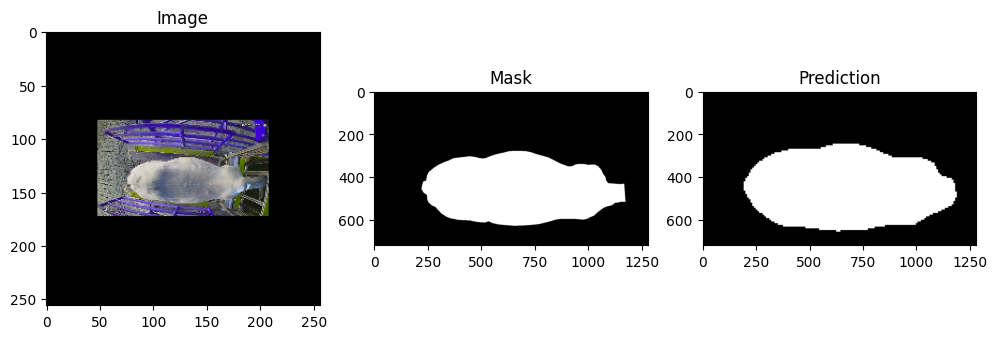

2089-6_dorsal_283.5.png


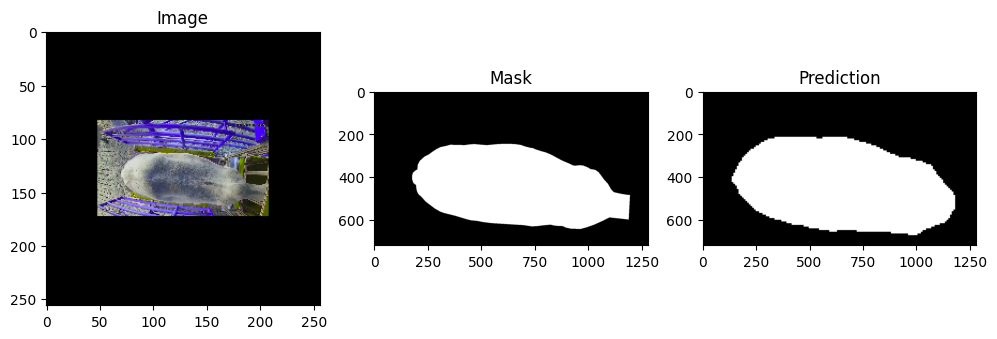

2089-7_dorsal_288.png


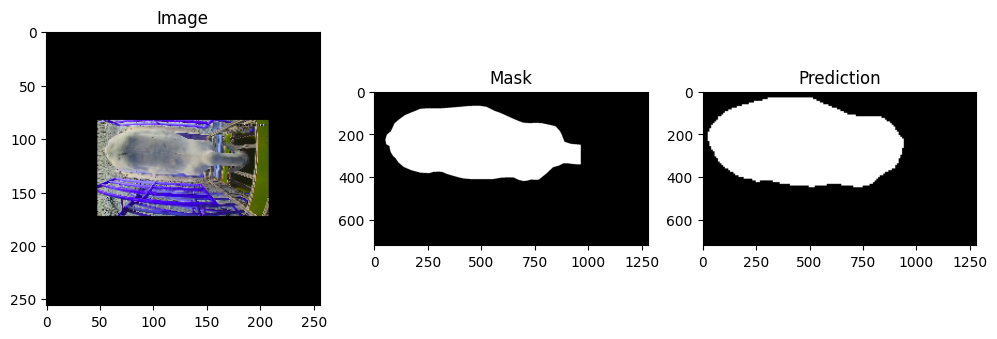

2089-8_dorsal_287.5.png


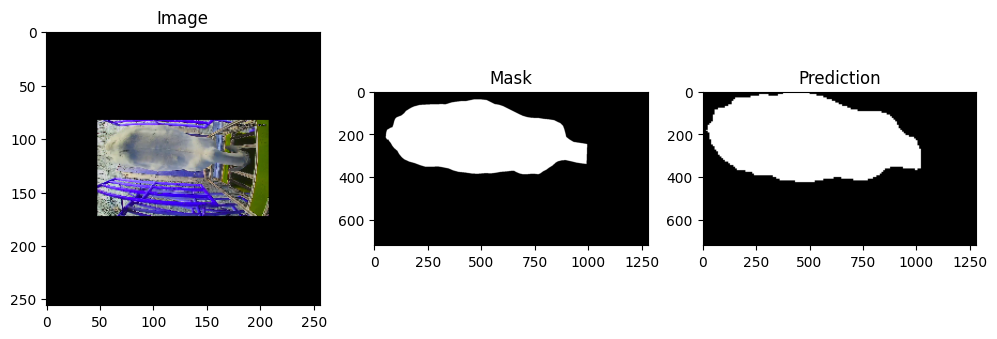

2089-9_dorsal_292.png


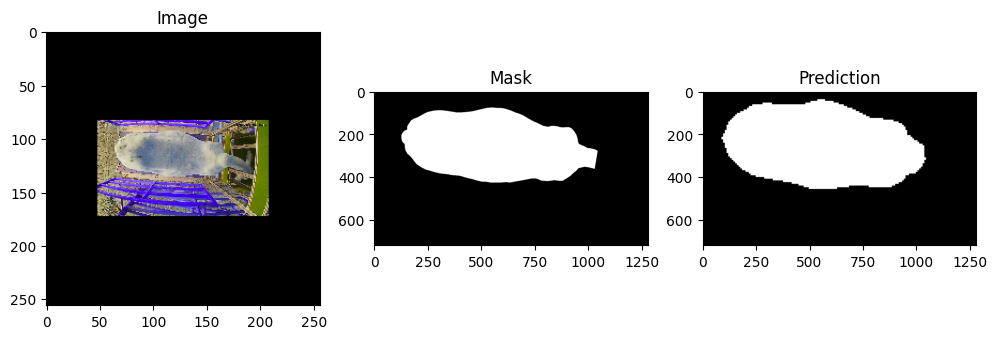

2094-1_dorsal_288.5.png


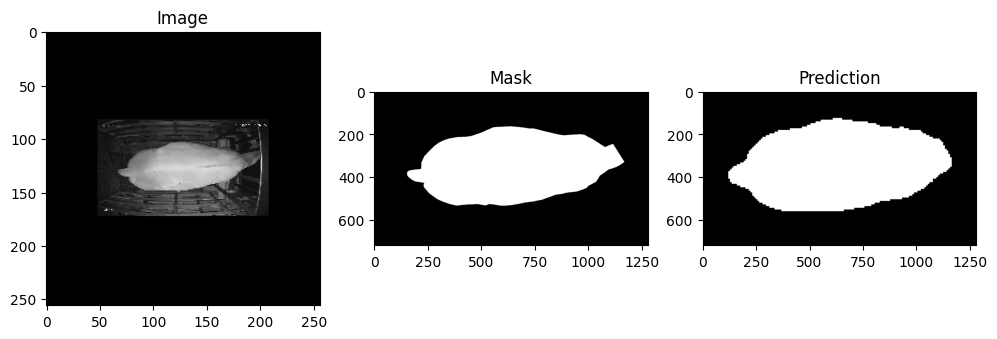

2094-2_dorsal_290.png


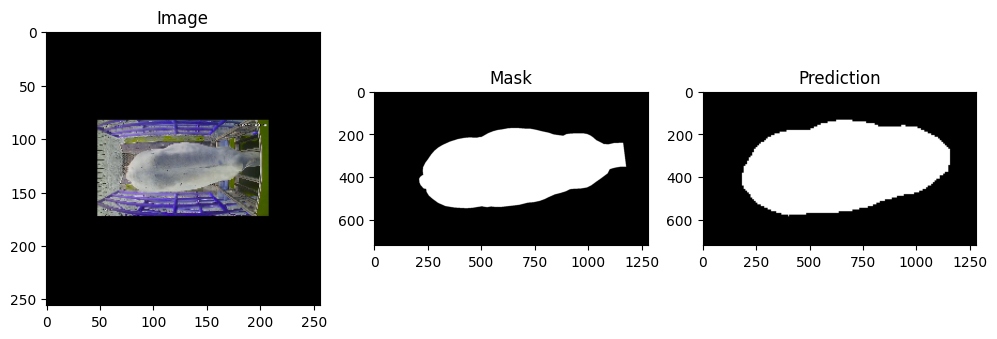

2098-1_dorsal_317.png


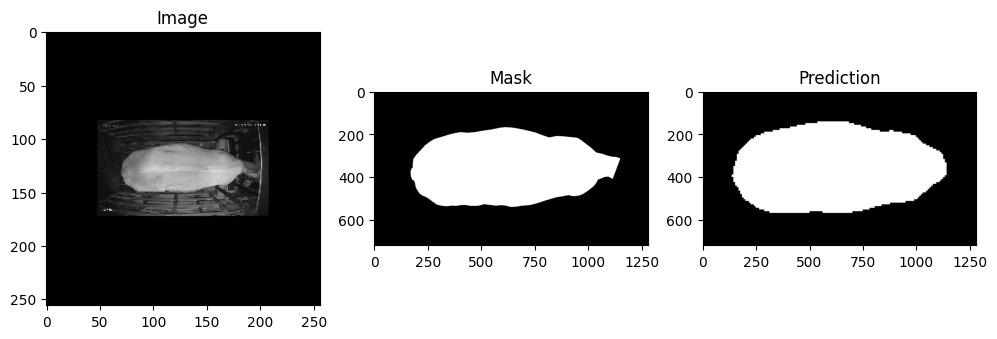

2098-2_dorsal_316.5.png


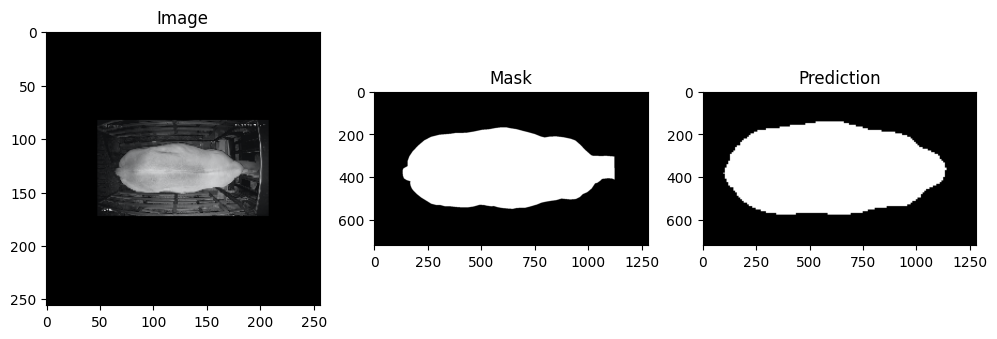

2098-3_dorsal_314.5.png


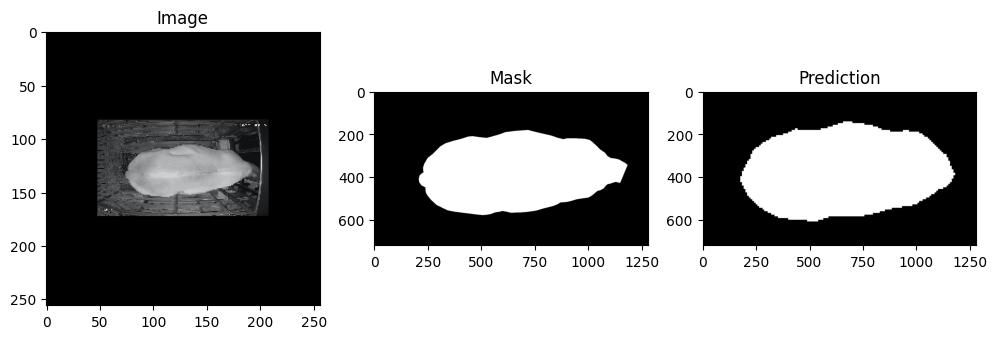

2098-4_dorsal_315.png


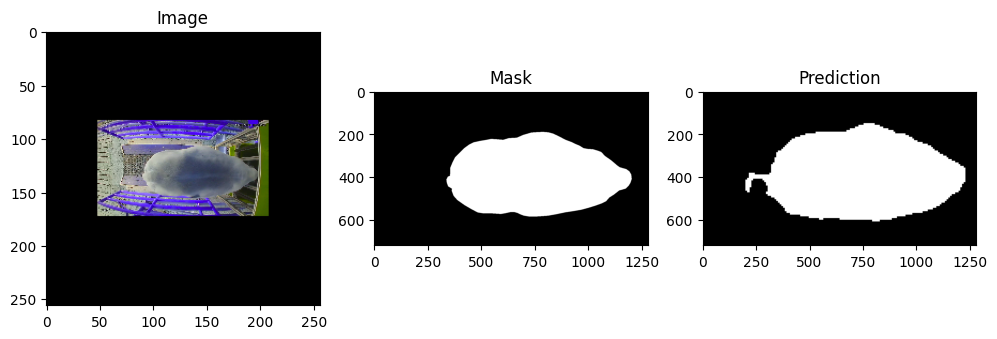

2107-1_dorsal_333.png


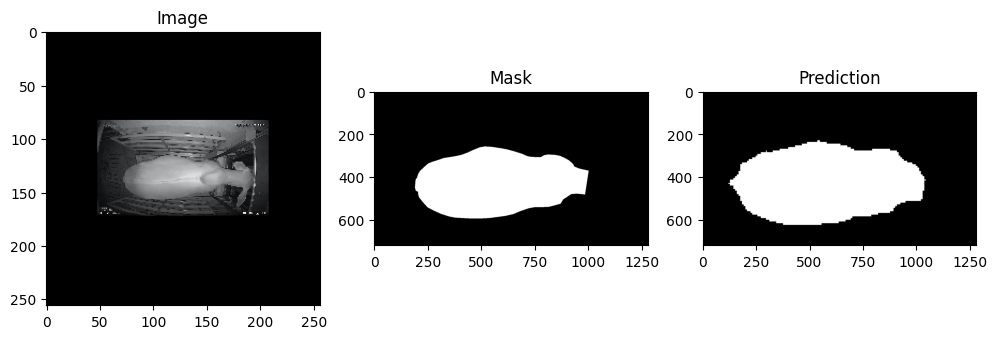

In [ ]:
import random
for i in range(200,len(X)):
  print(Y_ids[i])
# image_number = random.randint(0,len(X_train)-1)
  plt.figure(figsize=(12,8))
  plt.subplot(231)
  plt.title('Image')
  plt.imshow(X[i], cmap= 'gray')
  plt.subplot(232)
  plt.title('Mask')
  plt.imshow(Y[i], cmap= 'gray')
  plt.subplot(233)
  plt.title('Prediction')
  plt.imshow(bkp_masks[i], cmap= 'gray')
  plt.show()